# Exponential disk analysis
<img src="esp_disk_xy_zoom1_projection.gif" align="left" width="490px"/> 
<img src="esp_disk_xz_zoom1_projection.gif" align="right" width="490px"/>

### Useful functions

In [1]:
#Brightness profile
def prof(r):
    return I_0*np.exp(-r/R_d)

#Surface density
def dens(r):
    return sigma_0*np.exp(-r/R_d)

#cumulative
def r_cum(r):
    return 1 - np.exp(-r/R_d)*(1 + r/R_d)

In [2]:
#Potentials
def Hern_pot(r, H_mass, H_a):
    return -H_mass*G/(r + H_a)

def disk_pot(r):
    
    '''This function evaluates the potential of an exponential disk, using the 
    modified Bessel's functions K and I.'''
    
    y = r / (2 * R_d)
    
    I_0_y = scipy.special.iv(0, y)
    K_0_y = scipy.special.kv(0, y)
    I_1_y = scipy.special.iv(1, y)
    K_1_y = scipy.special.kv(1, y)
    
    return - np.pi * G * sigma_0 * r * (I_0_y * K_1_y - I_1_y * K_0_y)

def tot_pot(r):
    return disk_pot(r) + Hern_pot(r, M_halo, a_halo) + 0*Hern_pot(r, M_bulge, a_bulge)

In [3]:
#disk circular vel
def v_circ_disk(r):
    
    '''This function evaluates the disk circular velocity, using the modified Bessel's functions K and I.'''
    
    y = r / (2 * R_d)
    
    I_0_y = scipy.special.iv(0, y)
    K_0_y = scipy.special.kv(0, y)
    I_1_y = scipy.special.iv(1, y)
    K_1_y = scipy.special.kv(1, y)
    
    v_circ_disk2 = 4 * np.pi * G * sigma_0 * R_d * y**2 * (I_0_y * K_0_y - I_1_y * K_1_y)
    
    return np.sqrt( v_circ_disk2 )

#Hernquist halo and bulge circular vel
def v_Hern(r, H_mass, H_a):
    
    return np.sqrt(G * H_mass * r)/(r + H_a)

#total circular vel: squared sum
def v_circ(r):
    
    return np.sqrt( (v_circ_disk(r))**2 + (v_Hern(r, M_halo, a_halo))**2 + 0*(v_Hern(r, M_bulge, a_bulge))**2 )

In [4]:
#escape velocity
def v_escape(r):
    return np.sqrt( -2*( disk_pot(r) + 0*Hern_pot(r, M_halo, a_halo) + 0*Hern_pot(r, M_bulge, a_bulge)) )

In [5]:
#orbital freq
def omega_Hern(r,H_mass,H_a):
    
    return np.sqrt( G * H_mass / r  ) / (r + H_a)

def omega_circ_disk(r):
    
    '''This function evaluates the disk circular angular velocity, using the modified Bessel's functions K and I.'''
    
    return v_circ_disk(r) / r

def omega_tot(r):
    
    return np.sqrt( (omega_circ_disk(r))**2 + (omega_Hern(r,M_halo,a_halo))**2 + 0*(omega_Hern(r,M_bulge,a_bulge))**2 )

In [6]:
#epicyclic freq
def kappa_Hern(r,H_mass,H_a):
    return np.sqrt( G * H_mass * (r + 3 * H_a) / ( r * (r + H_a)**3  ))

def kappa_disk(r):
    
    '''This function evaluates the epicyclic frequency, using the modified Bessel's functions K and I.'''
    
    y = r / (2 * R_d)
    
    I_0_y = scipy.special.iv(0, y)
    K_0_y = scipy.special.kv(0, y)
    I_1_y = scipy.special.iv(1, y)
    K_1_y = scipy.special.kv(1, y)
    
    dI_0_y = scipy.special.ivp(0, y)
    dK_0_y = scipy.special.kvp(0, y)
    dI_1_y = scipy.special.ivp(1, y)
    dK_1_y = scipy.special.kvp(1, y)
    
    omega_2 = (omega_circ_disk(r))**2
    deriv = (dI_0_y * K_0_y + dK_0_y * I_0_y - I_1_y * dK_1_y - dI_1_y * K_1_y) * 0.5 * 1/R_d
    const = np.pi * G * sigma_0 / R_d
    
    return np.sqrt(4 * omega_2 + r * const * deriv)

def k_tot(r):
    return np.sqrt( (kappa_disk(r))**2 + (kappa_Hern(r,M_halo,a_halo))**2 + 0*(kappa_Hern(r,M_bulge,a_bulge))**2 )

In [7]:
#velocity dispersions

def sigma_r(r):
    
    Q = 1.2
    
    return 3.36 * G * Q * dens(r) / k_tot(r)

def sigma_phi(r):
    return sigma_r(r) * k_tot(r) / (2 * omega_tot(r) )

In [8]:
def confidence_ellipse(x, y, x0, y0, ax, n_std=3.0, facecolor='none', **kwargs):
    """
    Create a plot of the covariance confidence ellipse of *x* and *y*.

    Parameters
    ----------
    x, y : array-like, shape (n, )
        Input data.

    ax : matplotlib.axes.Axes
        The axes object to draw the ellipse into.

    n_std : float
        The number of standard deviations to determine the ellipse's radiuses.

    **kwargs
        Forwarded to `~matplotlib.patches.Ellipse`

    Returns
    -------
    matplotlib.patches.Ellipse
    """
    if x.size != y.size:
        raise ValueError("x and y must be the same size")

    cov = np.cov(x, y)
    pearson = cov[0, 1]/np.sqrt(cov[0, 0] * cov[1, 1])
    # Using a special case to obtain the eigenvalues of this
    # two-dimensional dataset.
    eigenvalues, eigenvectors = np.linalg.eigh(cov)
    
    major = np.sqrt(eigenvalues[1])
    minor = np.sqrt(eigenvalues[0])
    
    # Calculate the rotation angle from the largest eigenvec
    orientation_angle = np.arctan( eigenvectors[1][1]/eigenvectors[0][1] )
    if orientation_angle < 0: orientation_angle = np.pi + orientation_angle
    
    #Compute axial ratio and ellipticity where ratio of semi axis is ratio of eigenvalues
    axial_ratio = minor/major
    ellipticity = 1 - axial_ratio
    
    #Plot ellipse
    ell_radius_x = np.sqrt(1 + pearson)
    ell_radius_y = np.sqrt(1 - pearson)
    ellipse = Ellipse((x0, y0), width=ell_radius_x * 2, height=ell_radius_y * 2, facecolor=facecolor, **kwargs)
    
    # Calculating the standard deviation of x from
    # the squareroot of the variance and multiplying
    # with the given number of standard deviations.
    scale_x = np.sqrt(cov[0, 0]) * n_std
    mean_x = np.mean(x)

    # calculating the standard deviation of y ...
    scale_y = np.sqrt(cov[1, 1]) * n_std
    mean_y = np.mean(y)

    transf = transforms.Affine2D() \
        .rotate_deg(45) \
        .scale(scale_x, scale_y) \
        .translate(mean_x, mean_y)

    ellipse.set_transform(transf + ax.transData)
    return ax.add_patch(ellipse), axial_ratio, ellipticity, orientation_angle, major, minor

In [9]:
def ellipse_params(x, y):
    """
    Create covariance confidence ellipse of *x* and *y*.

    Parameters
    ----------
    x, y : array-like, shape (n, )
        Input data.
        
    Returns
    -------
    ellipse param: axis, rot angle
    """
    if x.size != y.size:
        raise ValueError("x and y must be the same size")

    cov = np.cov(x, y)
    pearson = cov[0, 1]/np.sqrt(cov[0, 0] * cov[1, 1])
    # Using a special case to obtain the eigenvalues of this
    # two-dimensional dataset.
    eigenvalues, eigenvectors = np.linalg.eigh(cov)
    
    major = np.sqrt(eigenvalues[1])
    minor = np.sqrt(eigenvalues[0])
    
    # Calculate the rotation angle from the largest eigenvec
    orientation_angle = np.arctan( eigenvectors[1][1]/eigenvectors[0][1] )
    if orientation_angle < 0: orientation_angle = np.pi + orientation_angle
    
    #Compute axial ratio and ellipticity where ratio of semi axis is ratio of eigenvalues
    axial_ratio = minor/major
    ellipticity = 1 - axial_ratio
    
    #Plot ellipse
    ell_radius_x = np.sqrt(1 + pearson)
    ell_radius_y = np.sqrt(1 - pearson)
    #ellipse = Ellipse((x0, y0), width=ell_radius_x * 2, height=ell_radius_y * 2, facecolor=facecolor, **kwargs)
    
    # Calculating the standard deviation of x from
    # the squareroot of the variance and multiplying
    # with the given number of standard deviations.
    #scale_x = np.sqrt(cov[0, 0]) * n_std
    #mean_x = np.mean(x)

    # calculating the standard deviation of y ...
    #scale_y = np.sqrt(cov[1, 1]) * n_std
    #mean_y = np.mean(y)

    #transf = transforms.Affine2D() \
    #    .rotate_deg(45) \
    #    .scale(scale_x, scale_y) \
    #    .translate(mean_x, mean_y)

    #ellipse.set_transform(transf + ax.transData)
    return axial_ratio, ellipticity, orientation_angle, major, minor

In [10]:
import numpy as np
import scipy
import math
import random
import pandas as pd
import scipy.interpolate as interp
from matplotlib import animation
from matplotlib.animation import FuncAnimation
from matplotlib.patches import Ellipse
import matplotlib.transforms as transforms
import matplotlib.pyplot as plt
import os
import time
from tqdm import tqdm
#from scipy.constants import G

from matplotlib import pyplot as plt
%matplotlib inline
#%config InlineBackend.figure_format='retina'

## Define params

In [11]:
#disk
I_0 = 1
M = 1
N = 20000
m = M/N
R_d = 1
sigma_0 = M / (2*np.pi*R_d**2)
G=1

#Hernquist halo
M_halo = 6
a_halo = 10

#Hernquist bulge (not used)
M_bulge = 0.5
a_bulge = 0.2

# Fetch initial distribution data

In [12]:
# reading the data from input-selected file

lines = pd.read_csv('exp_disk_distribution20k_halo.txt', names = list(range(3)), sep = '\s+')                 #N=20k 

N_particles = N
#s = N*3+3

t_in  = lines.iloc[2,0].copy()
m  = np.array([lines.iloc[i,0].copy() for i in range(3, N+3)])
x  = np.array([lines.iloc[i,0].copy() for i in range(N+3, 2*N+3)])
y  = np.array([lines.iloc[i,1].copy() for i in range(N+3, 2*N+3)])
z  = np.array([lines.iloc[i,2].copy() for i in range(N+3, 2*N+3)])
vx = np.array([lines.iloc[i,0].copy() for i in range(2*N+3, 3*N+3)])
vy = np.array([lines.iloc[i,1].copy() for i in range(2*N+3, 3*N+3)])
vz = np.array([lines.iloc[i,2].copy() for i in range(2*N+3, 3*N+3)])

In [13]:
v = np.sqrt(vx**2 + vy**2 + vz**2)
R = np.sqrt(x**2 + y**2 + z**2)

In [14]:
#center of mass

x_cm = np.sum(x[R < 5*R_d]*m[R < 5*R_d])/M
y_cm = np.sum(y[R < 5*R_d]*m[R < 5*R_d])/M
z_cm = 0# np.sum(z[R < 5*R_d]*m)/M

Rcm_in = np.sqrt(x_cm**2 + y_cm**2 + z_cm**3)

print(x_cm, y_cm, z_cm)

0.001448069721631839 -0.006438604977631021 0


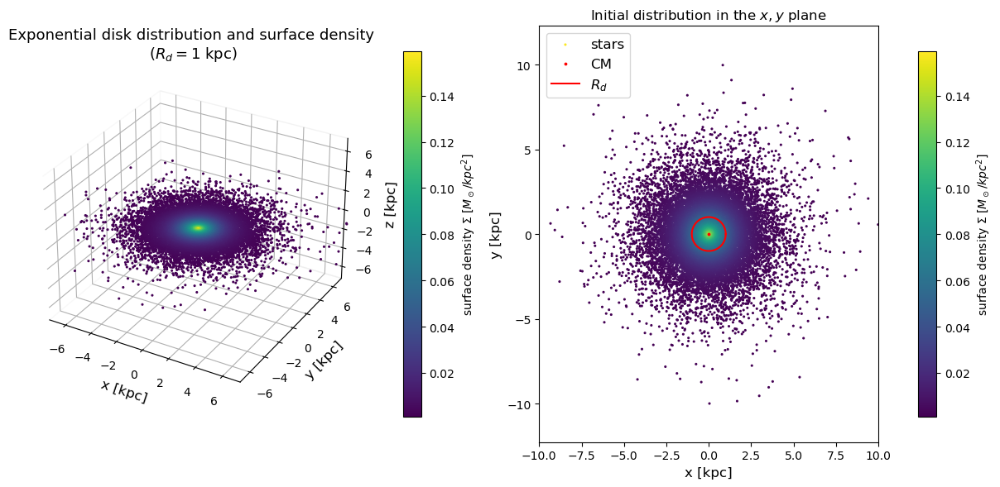

In [15]:
fig = plt.figure(figsize=(12, 6), tight_layout=True)

ax = fig.add_subplot(1, 2, 1, projection='3d')

ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False
image=ax.scatter(x, y, z, c = dens(R), alpha=1, s=1.5, cmap='viridis', clim=(np.exp(-5)*sigma_0 , sigma_0))
ax.set_xlabel('x [kpc]', fontsize=12)
ax.set_ylabel('y [kpc]', fontsize=12)
ax.set_zlabel('z [kpc]', fontsize=12)
ax.set_title('Exponential disk distribution and surface density \n($R_d=1$ kpc)', fontsize=13)
ax.set_xlim(-7 * R_d, 7 * R_d)
ax.set_ylim(-7 * R_d, 7 * R_d)
ax.set_zlim(-7 * R_d, 7 * R_d)
#ax.legend(fontsize='large')
plt.colorbar(image, label='surface density $\Sigma$ [$M_\odot / kpc^2$]', fraction=0.046, pad=0.1)
plt.tight_layout()
#plt.savefig('expdisk-dist.pdf')

ax = fig.add_subplot(1, 2, 2)

theta_Rd = np.linspace(0, 2*np.pi, 100)
R_rd = R_d
x1 = R_rd*np.cos(theta_Rd)
x2 = R_rd*np.sin(theta_Rd)

#for i in range(x.shape[0]):

    
image = ax.scatter(x, y, c = dens(R), alpha=1, s=1.5, label='stars', clim=(np.exp(-5)*sigma_0 , sigma_0), cmap='viridis')
ax.scatter(x_cm, y_cm, s=3, c='red', marker='o', label='CM') #Center of mass

ax.plot(x1, x2, color='red',alpha=1, label='$R_d$')
ax.set_xlabel('x [kpc]', fontsize=12)
ax.set_ylabel('y [kpc]', fontsize=12)
ax.axis('equal')
ax.set_title('Initial distribution in the $x, y$ plane')
ax.set_xlim(-10 * R_d, 10 * R_d)
ax.set_ylim(-10 * R_d, 10 * R_d)
plt.colorbar(image, label='surface density $\Sigma$ [$M_\odot / kpc^2$]', fraction=0.046, pad=0.1)
plt.tight_layout()
ax.legend(fontsize='large');

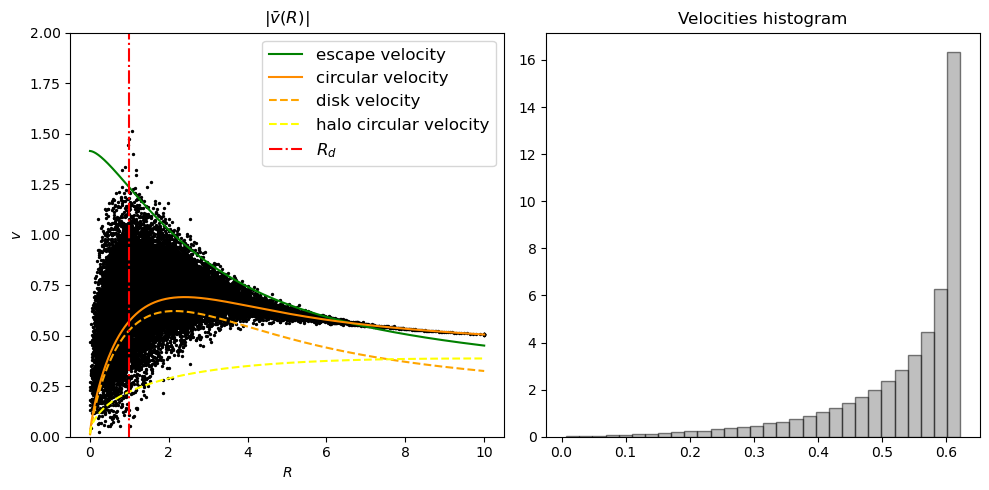

In [16]:
fig = plt.figure(tight_layout=True, figsize=(10, 5)) 

ax = fig.add_subplot(121)
ax.scatter(R[np.argsort(R)], v[np.argsort(R)], color='black', s=2) 
ax.plot(R[np.argsort(R)], v_escape(R)[np.argsort(R)], color='green', label='escape velocity') 
ax.plot(R[np.argsort(R)], v_circ(R)[np.argsort(R)], color='darkorange', label='circular velocity')
ax.plot(R[np.argsort(R)], v_circ_disk(R)[np.argsort(R)], color='orange', linestyle='dashed', label='disk velocity')
ax.plot(R[np.argsort(R)], v_Hern(R, M_halo, a_halo)[np.argsort(R)], color='yellow', linestyle='dashed', label='halo circular velocity')
ax.axvline(x=R_d, label='$R_d$', c='red', linestyle='-.')
ax.set_xlabel('$R$')
ax.set_ylabel('$v$')
ax.set_ylim(0,2)
ax.legend(fontsize='large')
ax.set_title(r'$|\bar{v}(R)|$')

ax = fig.add_subplot(122)
ax.hist(v_circ_disk(R), bins=30, histtype='barstacked', color='grey', fill='true', alpha=0.5, edgecolor='black', density=True)
ax.set_title('Velocities histogram')

plt.tight_layout()
plt.show()

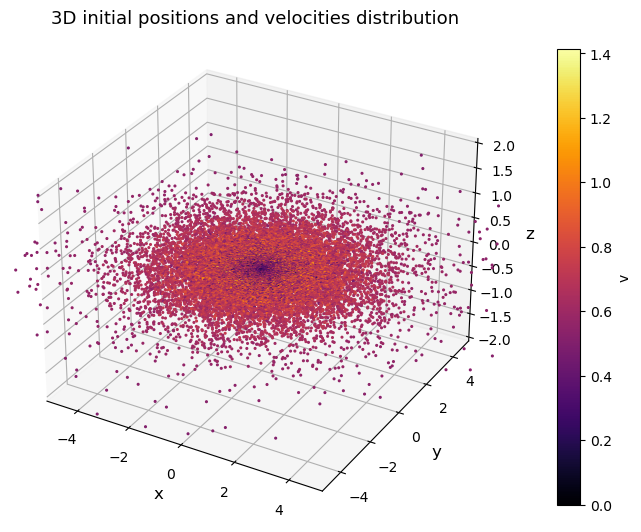

In [17]:
fig = plt.figure(figsize=(6, 6))
ax  = plt.axes(projection='3d')

image=ax.scatter(x, y, z, c = v, alpha=1, s=1.5, cmap='inferno', clim=(0, max(v_escape(R))))
ax.set_xlabel('x', fontsize=12)
ax.set_ylabel('y', fontsize=12)
ax.set_zlabel('z', fontsize=12)
ax.set_xlim(-5 * R_d, 5 * R_d)
ax.set_ylim(-5 * R_d, 5 * R_d)
ax.set_zlim(-2 * R_d, 2 * R_d) 
ax.set_title('3D initial positions and velocities distribution', fontsize=13)
#ax.axis('equal')
plt.tight_layout()
plt.colorbar(image, label='v', fraction=0.04, pad=0.1);

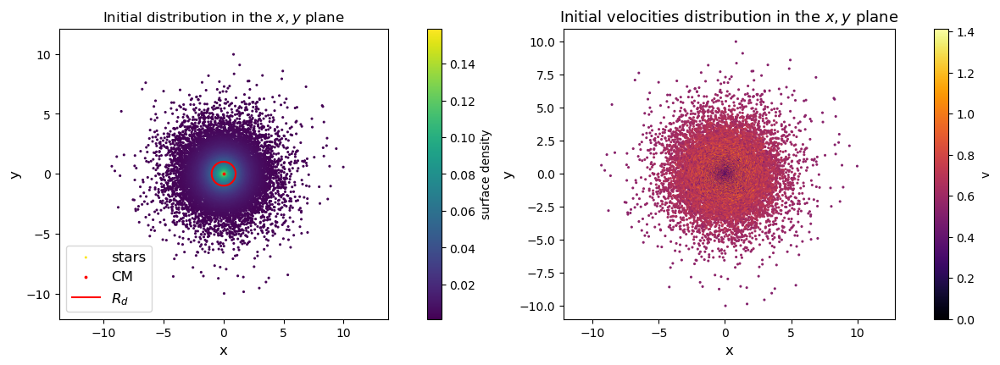

In [18]:
fig = plt.figure(figsize=(12, 8))
ax  = fig.add_subplot(222)

image=ax.scatter(x, y, c = v, alpha=1, s=1.5, cmap='inferno', clim=(0, max(v_escape(R))))
ax.set_xlabel('x', fontsize=12)
ax.set_ylabel('y', fontsize=12)
ax.axis('equal')
ax.set_xlim(-10 * R_d, 10 * R_d)
ax.set_ylim(-10 * R_d, 10 * R_d)
ax.set_title('Initial velocities distribution in the $x, y$ plane', fontsize=13)
ax.axis('equal')
plt.tight_layout()
plt.colorbar(image, label='v', fraction=0.04, pad=0.1)

ax = fig.add_subplot(221)

theta_Rd = np.linspace(0, 2*np.pi, 100)
R_rd = R_d
x1 = R_rd*np.cos(theta_Rd)
x2 = R_rd*np.sin(theta_Rd)

#for i in range(x.shape[0]):

    
image = ax.scatter(x, y, c = dens(R), alpha=1, s=1.5, label='stars', clim=(np.exp(-5)*sigma_0 , sigma_0), cmap='viridis')
ax.scatter(x_cm, y_cm, s=3, c='red', marker='o', label='CM') #Center of mass

ax.plot(x1, x2, color='red',alpha=1, label='$R_d$')
ax.set_xlabel('x', fontsize=12)
ax.set_ylabel('y', fontsize=12)
ax.axis('equal')
ax.set_title('Initial distribution in the $x, y$ plane')
ax.set_xlim(-10.2 * R_d, 10.2 * R_d)
ax.set_ylim(-10.2 * R_d, 10.2 * R_d)
plt.colorbar(image, label='surface density', fraction=0.046, pad=0.1)
ax.legend(fontsize='large')
plt.tight_layout()
plt.show()

In [19]:
x_grid = np.linspace(-6 * R_d, 6 * R_d, 100)
y_grid = np.linspace(-6 * R_d, 6 * R_d, 100)

X, Y = np.meshgrid(x_grid, y_grid)
Z = disk_pot(np.sqrt(X**2+Y**2))

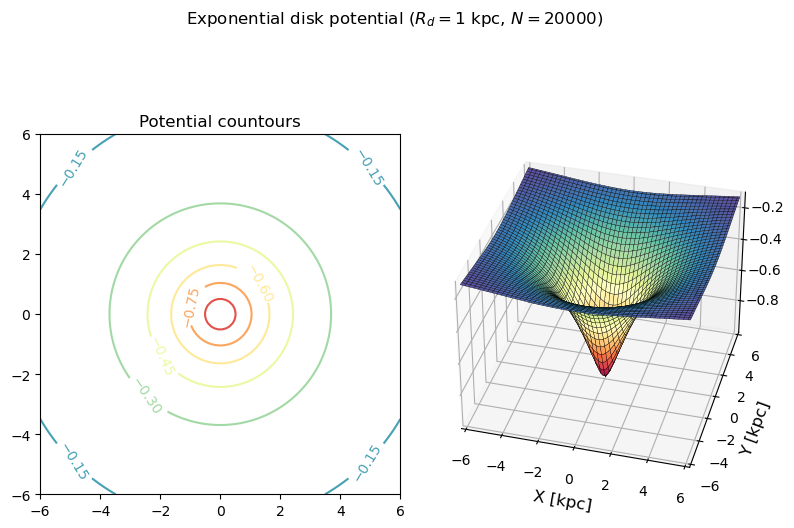

In [20]:
fig = plt.figure(figsize=(8, 6), tight_layout=True)
fig.suptitle('Exponential disk potential ($R_d='f'{R_d}''$ kpc, $N ='f'{N}''$)', fontsize=12)

ax = fig.add_subplot(121)


CS = ax.contour(X, Y, Z, cmap='Spectral')
ax.clabel(CS, inline=True, fontsize=10)
ax.set_title('Potential countours')
ax.set_xlim(-6 * R_d, 6 * R_d)
ax.set_ylim(-6 * R_d, 6 * R_d)
ax.set_aspect('equal')

ax = fig.add_subplot(122, projection='3d')

#ax.xaxis.pane.fill = False
#ax.yaxis.pane.fill = False
#ax.zaxis.pane.fill = False
 
ax.plot_surface(X, Y, Z, cmap='Spectral', edgecolor='black', lw=0.25)
ax.set_xlabel('X [kpc]', fontsize=12)
ax.set_ylabel('Y [kpc]', fontsize=12)
ax.set_zlabel('\n\n $\Phi(R)$ [$M_{\odot}$ / kpc]', fontsize=12)
ax.set_xlim(-6 * R_d, 6 * R_d)
ax.set_ylim(-6 * R_d, 6 * R_d)
ax.set_zlim(np.min(Z), np.max(Z))
ax.view_init(35, -75)
plt.tight_layout();
#plt.savefig('expdisk-dist.pdf');

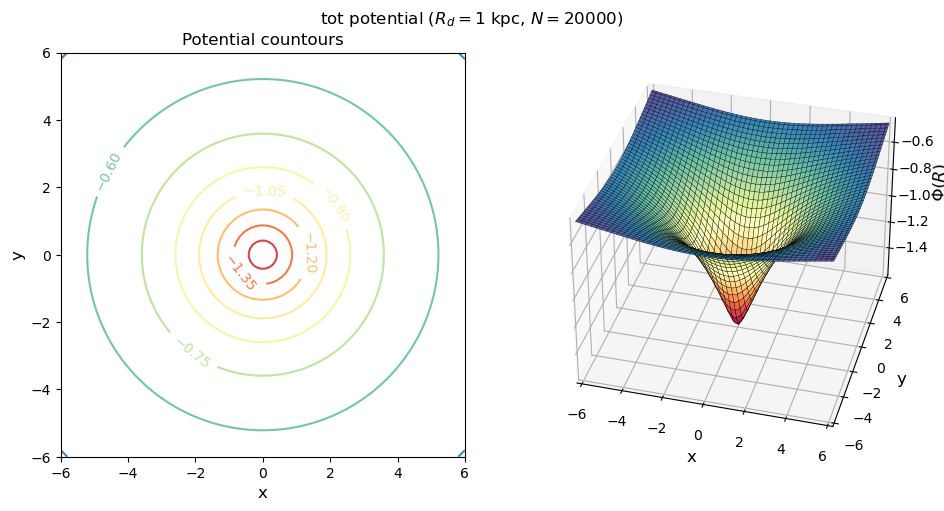

In [21]:
#%matplotlib notebook

Z = tot_pot(np.sqrt(X**2+Y**2))

fig = plt.figure(figsize=(10, 5), tight_layout=True)
fig.suptitle('tot potential ($R_d='f'{R_d}''$ kpc, $N ='f'{N}''$)', fontsize=12)

ax = fig.add_subplot(121)


CS = ax.contour(X, Y, Z, cmap='Spectral')
ax.clabel(CS, inline=True, fontsize=10)
ax.set_xlabel('x', fontsize=12)
ax.set_ylabel('y', fontsize=12)
ax.set_title('Potential countours')
ax.set_xlim(-6 * R_d, 6 * R_d)
ax.set_ylim(-6 * R_d, 6 * R_d)
ax.set_aspect('equal')

ax = fig.add_subplot(122, projection='3d')

#ax.xaxis.pane.fill = False
#ax.yaxis.pane.fill = False
#ax.zaxis.pane.fill = False
 
ax.plot_surface(X, Y, Z, cmap='Spectral', edgecolor='black', lw=0.25)
ax.set_xlabel('x', fontsize=12)
ax.set_ylabel('y', fontsize=12)
ax.set_zlabel('$\Phi(R)$', fontsize=12)
ax.set_xlim(-6 * R_d, 6 * R_d)
ax.set_ylim(-6 * R_d, 6 * R_d)
ax.set_zlim(np.min(Z), np.max(Z))
ax.view_init(35, -75)

plt.tight_layout();
#plt.savefig('expdisk-dist.pdf');

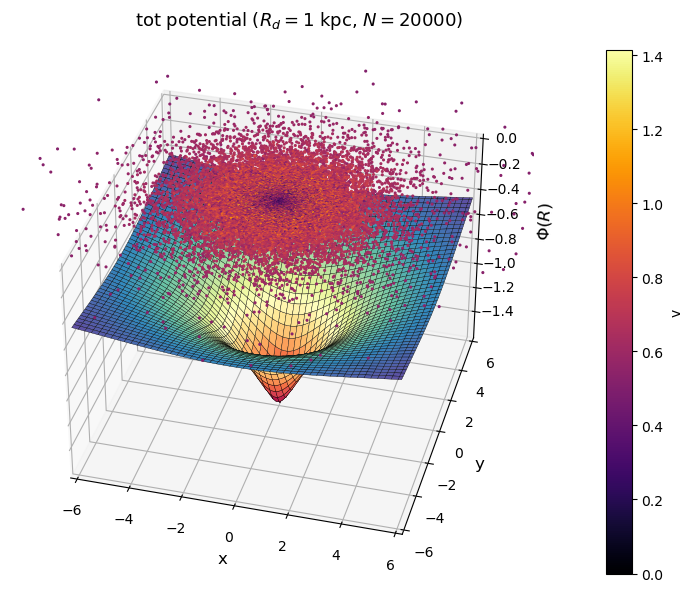

In [22]:
#%matplotlib notebook

Z = tot_pot(np.sqrt(X**2+Y**2))

fig = plt.figure(figsize=(8, 6), tight_layout=True)
fig.suptitle('tot potential ($R_d='f'{R_d}''$ kpc, $N ='f'{N}''$)', fontsize=13)

ax = fig.add_subplot(111, projection='3d')

image=ax.scatter(x, y, z, c = v, alpha=1, s=1.5, cmap='inferno', clim=(0, max(v_escape(R)))) 
ax.plot_surface(X, Y, Z, cmap='Spectral', edgecolor='black', lw=0.25)
ax.set_xlabel('x', fontsize=12)
ax.set_ylabel('y', fontsize=12)
ax.set_zlabel('\n\n $\Phi(R)$', fontsize=12)
ax.set_xlim(-6 * R_d, 6 * R_d)
ax.set_ylim(-6 * R_d, 6 * R_d)
ax.set_zlim(np.min(Z), 0)
ax.view_init(35, -75)

plt.colorbar(image, label='v', fraction=0.04, pad=0.1);
plt.tight_layout();
#plt.savefig('expdisk-dist.pdf');

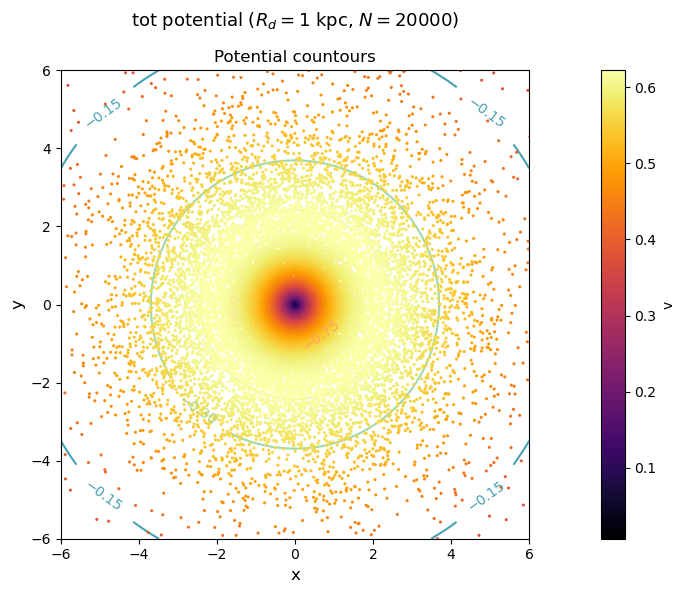

In [23]:
Z = disk_pot(np.sqrt(X**2+Y**2))

fig = plt.figure(figsize=(8, 6), tight_layout=True)
fig.suptitle('tot potential ($R_d='f'{R_d}''$ kpc, $N ='f'{N}''$)', fontsize=13)

ax = fig.add_subplot(111)

image=ax.scatter(x, y, c = v_circ_disk(R), alpha=1, s=1.5, cmap='inferno', clim=(min(v_circ_disk(R)), max(v_circ_disk(R)))) 
CS = ax.contour(X, Y, Z, cmap='Spectral',zorder=-1)
ax.clabel(CS, inline=True, fontsize=10)
ax.set_title('Potential countours')
ax.set_xlim(-6 * R_d, 6 * R_d)
ax.set_ylim(-6 * R_d, 6 * R_d)
ax.set_xlabel('x', fontsize=12)
ax.set_ylabel('y', fontsize=12)
ax.set_aspect('equal')

plt.colorbar(image, label='v', fraction=0.04, pad=0.1);
plt.tight_layout();

# Analysis of results

### Treecode param

In [24]:
T = 2 * np.pi / omega_tot(R_d)
print('Orbital period for R=R_d:', T)

Orbital period for R=R_d: 10.978525277396656


In [25]:
T_sim = 50 * T
print('Simulation time:', T_sim)

dt = T_sim / 1000
print('Time step:', dt)

theta = 0.2
print('Theta:', theta)

t_out = dt
print('Terminal out:', t_out)

Simulation time: 548.9262638698328
Time step: 0.5489262638698328
Theta: 0.2
Terminal out: 0.5489262638698328


In [26]:
# reading the data from output-selected file

lines = pd.read_csv('outdata_expdisk20k_halo.txt', names = list(range(3)), sep = '\s+')

N_particles = N
s = N*3+3

t_s  = np.array([lines.iloc[2::s,0].copy().dropna()]).flatten()
m_s  = np.array([lines.iloc[i::s,0].copy().dropna() for i in range(3, N+3)])
x_s  = np.array([lines.iloc[i::s,0].copy().dropna() for i in range(N+3, 2*N+3)])
y_s  = np.array([lines.iloc[i::s,1].copy().dropna() for i in range(N+3, 2*N+3)])
z_s  = np.array([lines.iloc[i::s,2].copy().dropna() for i in range(N+3, 2*N+3)])
vx_s = np.array([lines.iloc[i::s,0].copy().dropna() for i in range(2*N+3, 3*N+3)])
vy_s = np.array([lines.iloc[i::s,1].copy().dropna() for i in range(2*N+3, 3*N+3)])
vz_s = np.array([lines.iloc[i::s,2].copy().dropna() for i in range(2*N+3, 3*N+3)])

In [27]:
R_t = np.zeros((N,len(t_s)))

for k in range(0,len(t_s)):
    R_t[:,k] = np.sqrt( x_s[:,k]**2 + y_s[:,k]**2 + z_s[:,k]**2)
    
R_t.shape

(20000, 1001)

In [28]:
x_cm_t = np.zeros(len(t_s))
y_cm_t = np.zeros(len(t_s))
z_cm_t = np.zeros(len(t_s))

for i in range(len(t_s)):

    x_cm_t[i] = np.sum(x_s[:,i])/N
    y_cm_t[i] = np.sum(y_s[:,i])/N
    z_cm_t[i] = np.sum(z_s[:,i])/N
    
R_cm = np.sqrt((x_cm_t)**2 + (y_cm_t)**2 + (z_cm_t)**2)
R_cm

array([0.01224801, 0.01357763, 0.01504705, ..., 0.06652632, 0.06685758,
       0.06713197])

In [29]:
v_t = np.zeros((N,len(t_s)))

for k in range(0,len(t_s)):
    v_t[:,k] = np.sqrt( vx_s[:,k]**2 + vy_s[:,k]**2 + vz_s[:,k]**2 )
    
v_t.shape

(20000, 1001)

In [30]:
dens_t = np.zeros((N,len(t_s)))

for k in range(0,len(t_s)):
    dens_t[:,k] = dens(R_t[:,k])
    
dens_t.shape

(20000, 1001)

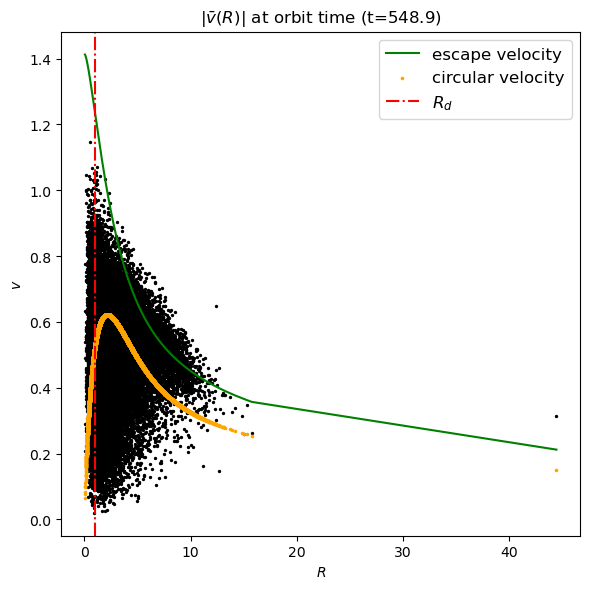

In [31]:
fig, ax = plt.subplots(tight_layout=True, figsize=(6, 6)) 

ax.scatter(R_t[:,len(t_s)-1][np.argsort(R_t[:,len(t_s)-1])], v_t[:,len(t_s)-1][np.argsort(R_t[:,len(t_s)-1])], color='black', s=2) 
ax.plot(R_t[:,len(t_s)-1][np.argsort(R_t[:,len(t_s)-1])], v_escape(R_t[:,len(t_s)-1])[np.argsort(R_t[:,len(t_s)-1])], color='green', label='escape velocity') 
ax.scatter(R_t[:,len(t_s)-1][np.argsort(R_t[:,len(t_s)-1])], v_circ_disk(R_t[:,len(t_s)-1])[np.argsort(R_t[:,len(t_s)-1])], color='orange', s=2.5, label='circular velocity')
ax.axvline(x=R_d, label='$R_d$', c='red', linestyle='-.')
ax.set_xlabel('$R$')
ax.set_ylabel('$v$')
#ax.set_xlim(-1,12*R_d)
#ax.set_ylim(-0.2,2)
ax.legend(fontsize='large')
ax.set_title(r'$|\bar{v}(R)|$ at orbit time 'f'(t={round(T_sim,1)})');

In [32]:
v_esc_end = max(v_escape(R_t[:,len(t_s)-1]))
v_esc_end

1.4124462298096656

In [33]:
left = v_t[np.where(v_t[:,len(t_s)-1] > v_escape(R_t[:,len(t_s)-1]))]
left.shape
ratio_left = left.shape[0]/N*100
print("ratio of particle that have left the system: ", ratio_left,"%")

ratio of particle that have left the system:  6.329999999999999 %


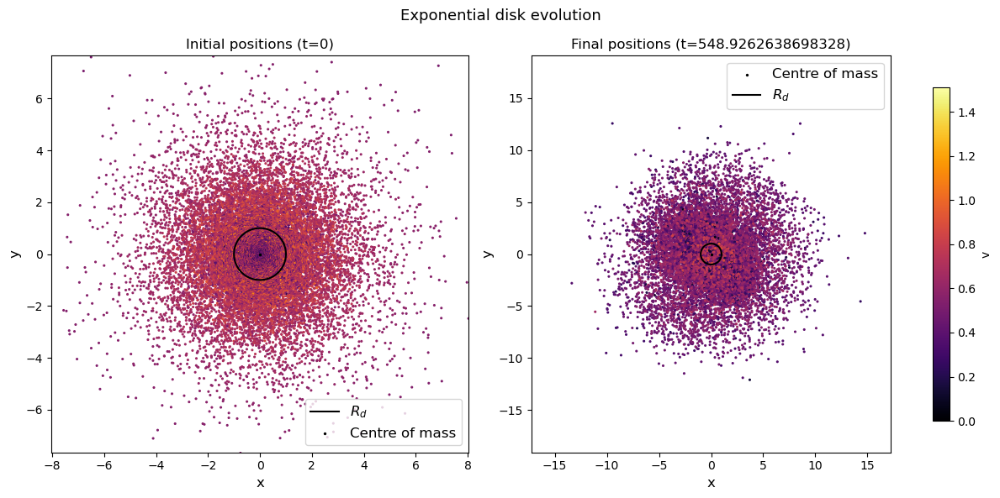

In [34]:
fig = plt.figure(figsize=(12, 6), tight_layout=True)
fig.suptitle('Exponential disk evolution', fontsize=13)

ax = fig.add_subplot(121)


theta_Rd = np.linspace(0, 2*np.pi, 100)
x1 = R_d*np.cos(theta_Rd)
x2 = R_d*np.sin(theta_Rd)

#ax[0].scatter(x_s[:, 0], y_s[:, 0], c = np.sqrt(x_s[:, 0]**2+y_s[:, 0]**2), alpha=1, s=1.5, cmap='inferno', clim=(-6 * R_d, 6 * R_d))
ax.scatter(x_s[:, 0], y_s[:, 0], c = v_t[:,0], alpha=1, s=1.5, cmap='inferno', clim=(0, 1.5))
ax.set_title('Initial positions (t=0)')
ax.plot(x1, x2, color='black',alpha=1, label='$R_d$')
ax.scatter(x_cm, y_cm, s=2, c='black', marker='o', label='Centre of mass') #Center of mass
ax.axis('equal')
ax.legend(fontsize='large')
ax.set_xlabel('x', fontsize=12)
ax.set_ylabel('y', fontsize=12)
ax.set_xlim(-7 * R_d, 7 * R_d)
ax.set_ylim(-7 * R_d, 7 * R_d)
ax.set_aspect('equal');

ax = fig.add_subplot(122)

#ax.xaxis.pane.fill = False
#ax.yaxis.pane.fill = False
#ax.zaxis.pane.fill = False
 
img=ax.scatter(x_s[:, len(t_s)-1], y_s[:, len(t_s)-1], c = v_t[:,len(t_s)-1], alpha=1, s=1.5, cmap='inferno', clim=(0, max(v)))
ax.scatter(x_cm_t[len(t_s)-1], y_cm_t[len(t_s)-1], s=2, c='black', marker='o', label='Centre of mass') #Center of mass
ax.set_title(f'Final positions (t={T_sim})')
ax.plot(x1, x2, color='black',alpha=1, label='$R_d$')
ax.axis('equal')
ax.legend(fontsize='large')
ax.set_xlabel('x', fontsize=12)
ax.set_ylabel('y', fontsize=12)
ax.set_xlim(-15 * R_d, 15 * R_d)
ax.set_ylim(-15 * R_d, 15 * R_d)
plt.colorbar(img, label='v', fraction=0.04, pad=0.1);


plt.tight_layout();

## Lagrangian radii & Centre of mass

In [35]:
#lagrangian radii

lag_80 = []
lag_60 = []
lag_50 = []
lag_10 = []

for i in range(len(t_s)):
    r_sort = R_t[:,i]

    lag_80.append(np.max(r_sort[r_sort < np.quantile(r_sort, 0.8)]))
    lag_60.append(np.max(r_sort[r_sort < np.quantile(r_sort, 0.6)]))
    lag_50.append(np.max(r_sort[r_sort < np.quantile(r_sort, 0.5)]))
    lag_10.append(np.max(r_sort[r_sort < np.quantile(r_sort, 0.1)]))


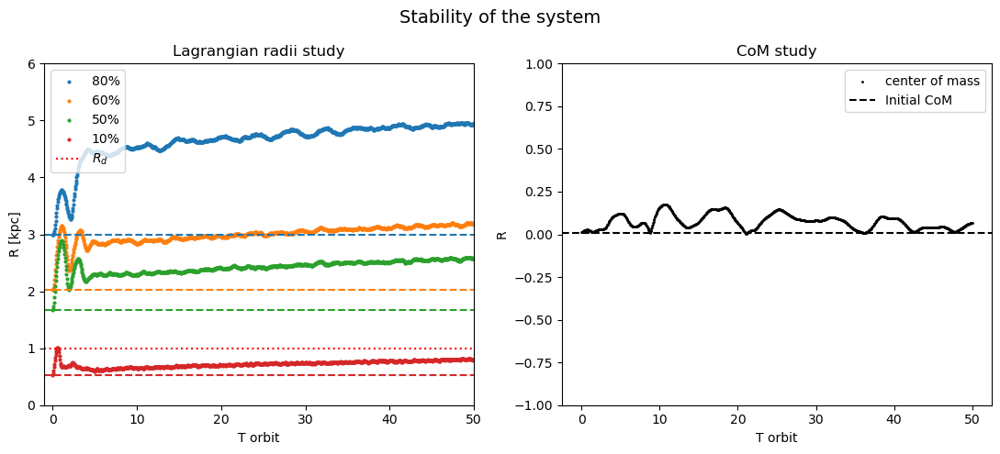

In [36]:
fig = plt.figure(figsize=(11, 5), tight_layout=True)
fig.suptitle('Stability of the system', fontsize=14)

ax = fig.add_subplot(121)
ax.scatter(t_s/T, lag_80, label="80%",s=4)
ax.scatter(t_s/T, lag_60, label="60%",s=4)
ax.scatter(t_s/T, lag_50, label="50%",s=4)
ax.scatter(t_s/T, lag_10, label="10%",s=4)
ax.axhline(R_d, color='r', linestyle='dotted', label='$R_d$')

ax.axhline(lag_80[0], color='tab:blue', linestyle='dashed')
ax.axhline(lag_60[0], color='tab:orange', linestyle='dashed')
ax.axhline(lag_50[0], color='tab:green', linestyle='dashed')
ax.axhline(lag_10[0], color='tab:red', linestyle='dashed')

ax.set_xlabel("T orbit")
ax.set_ylabel("R [kpc]")
ax.set_title("Lagrangian radii study")
ax.legend()
ax.set_xlim(-1,50)
ax.set_ylim(0,6*R_d)

ax = fig.add_subplot(122)
ax.scatter(t_s/T, R_cm, label="center of mass",s=1,c='black')
ax.axhline(Rcm_in, color='black', linestyle='dashed', label='Initial CoM')

ax.set_xlabel("T orbit")
ax.set_ylabel("R")
ax.set_title("CoM study")
ax.legend()
ax.set_ylim(-1*R_d,R_d)

plt.tight_layout()
plt.show()

In [37]:
v_esc_t = max(v_escape(R_t[:,0]))
v_esc_t

1.4141946946723465

## Evolution frames

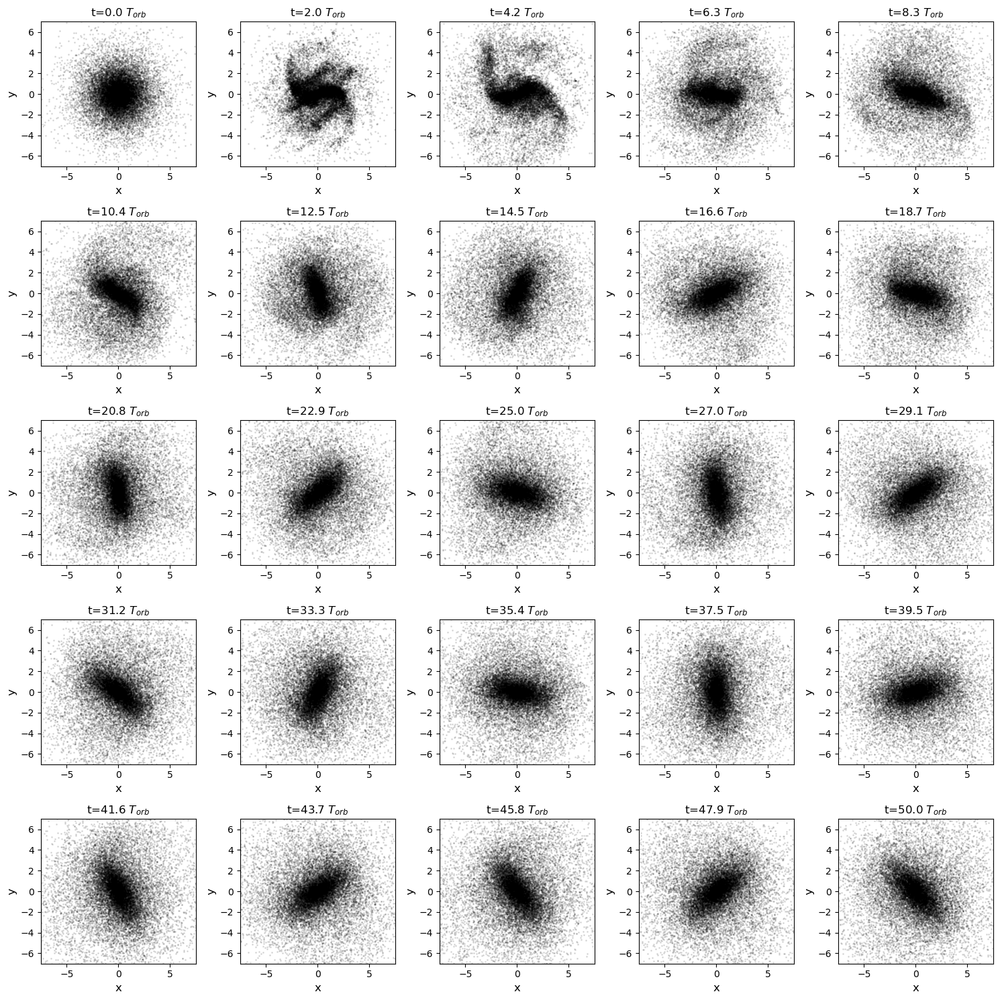

In [38]:
fig = plt.figure(figsize=(15, 15), tight_layout=True)

frames=25
index=1
time_array=np.linspace(0, len(t_s)-1, frames, dtype=int)

t_dyn_units = t_s/T

for i in time_array:
    ax=fig.add_subplot(int(np.sqrt(frames)), int(np.sqrt(frames)),index)
    plt.scatter(x_s[:, i], y_s[:, i], c='black',s=1.2,alpha=0.1)
    plt.title(r't=%.1f $T_{orb}$' %t_dyn_units[i])
#    plt.scatter(x1, x2, color='red',alpha=1, s=0.5, label='$R_d$')
    plt.axis('equal')
    plt.xlabel('x', fontsize=12)
    plt.ylabel('y', fontsize=12)
    plt.xlim(-7 * R_d, 7 * R_d)
    plt.ylim(-7 * R_d, 7 * R_d)
    
    index +=1
    
plt.show()

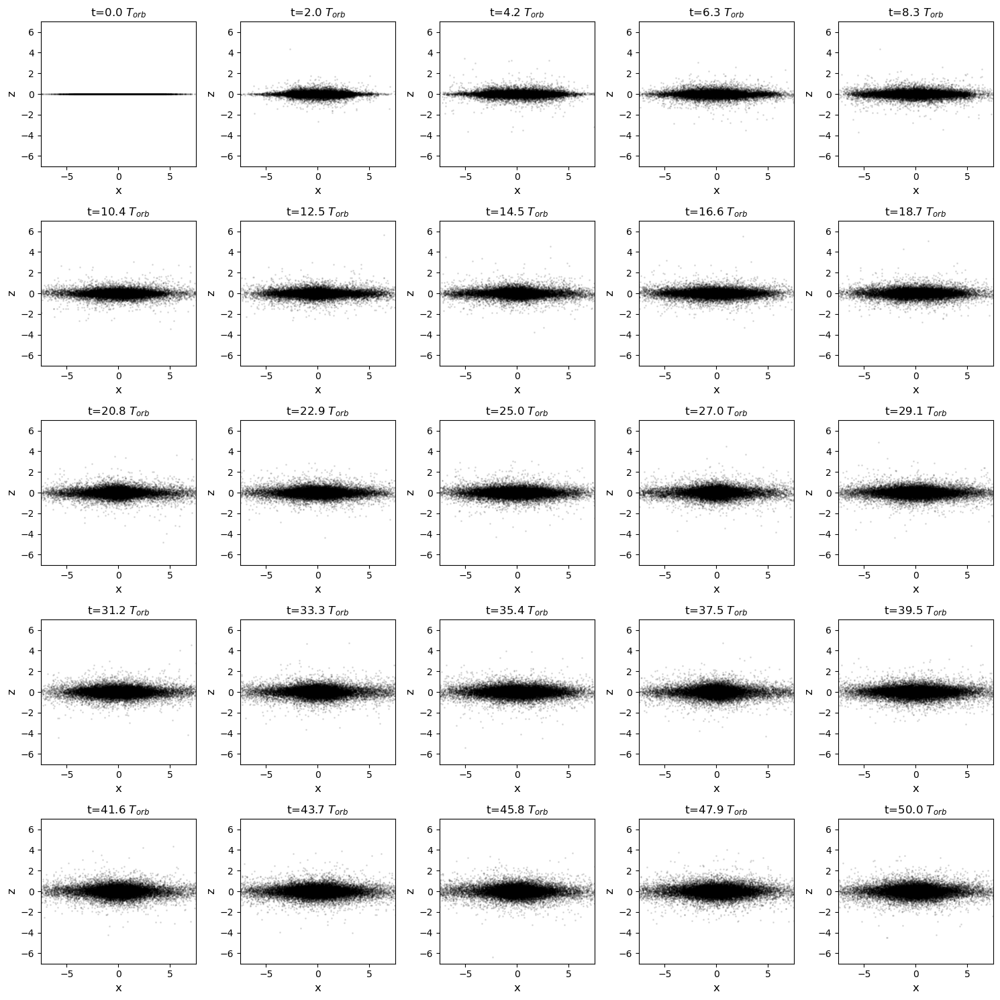

In [39]:
fig = plt.figure(figsize=(15, 15), tight_layout=True)

frames=25
index=1
time_array=np.linspace(0, len(t_s)-1, frames, dtype=int)

    
for i in time_array:
    ax=fig.add_subplot(int(np.sqrt(frames)), int(np.sqrt(frames)), index)
    plt.scatter(x_s[:, i], z_s[:, i], c='black',s=1.2,alpha=0.1)
    plt.title(r't=%.1f $T_{orb}$' %t_dyn_units[i])
#    plt.scatter(x1, x2, color='red',alpha=1, s=0.5, label='$R_d$')
    plt.axis('equal')
    plt.xlabel('x', fontsize=12)
    plt.ylabel('z', fontsize=12)
    plt.xlim(-7 * R_d, 7 * R_d)
    plt.ylim(-7 * R_d, 7 * R_d)
    
    index +=1

plt.show()

### Velocity map

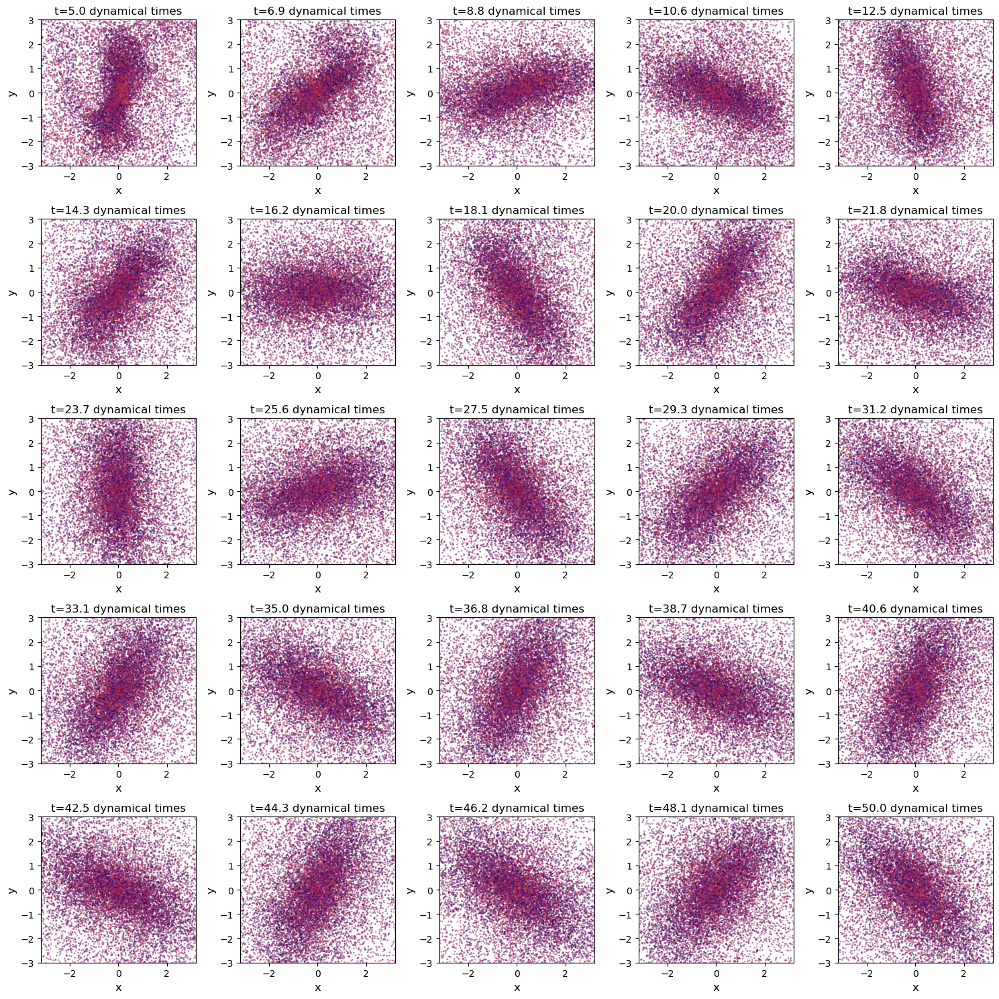

In [40]:
fig = plt.figure(figsize=(15, 15), tight_layout=True)

frames=25
index=1
time_array=np.linspace(100, len(t_s)-1, frames, dtype=int)


for i in time_array:
    ax=fig.add_subplot(int(np.sqrt(frames)), int(np.sqrt(frames)),index)
    plt.scatter(x_s[:, i], y_s[:, i], c=v_t[:,i], s=1., alpha=0.4, cmap='inferno', clim=(0, max(v)))
    plt.title('t=%.1f dynamical times' %t_dyn_units[i])
#    plt.scatter(x1, x2, color='red',alpha=1, s=0.5, label='$R_d$')
    plt.scatter(x_cm_t[i], y_cm_t[i], s=2, c='red') #Center of mass
    plt.axis('equal')
    plt.xlabel('x', fontsize=12)
    plt.ylabel('y', fontsize=12)
    plt.xlim(-3*R_d,3*R_d)
    plt.ylim(-3*R_d,3*R_d)
    
    index +=1

plt.show()

### Density map

In [41]:
# Define the size of the 2D grid and create an empty density distribution array
grid_size = 80
density_distribution = np.zeros((grid_size, grid_size))

# Discretize positions onto the grid
x_bins = np.linspace(-4, 4, grid_size+1)
y_bins = np.linspace(-4, 4, grid_size+1)

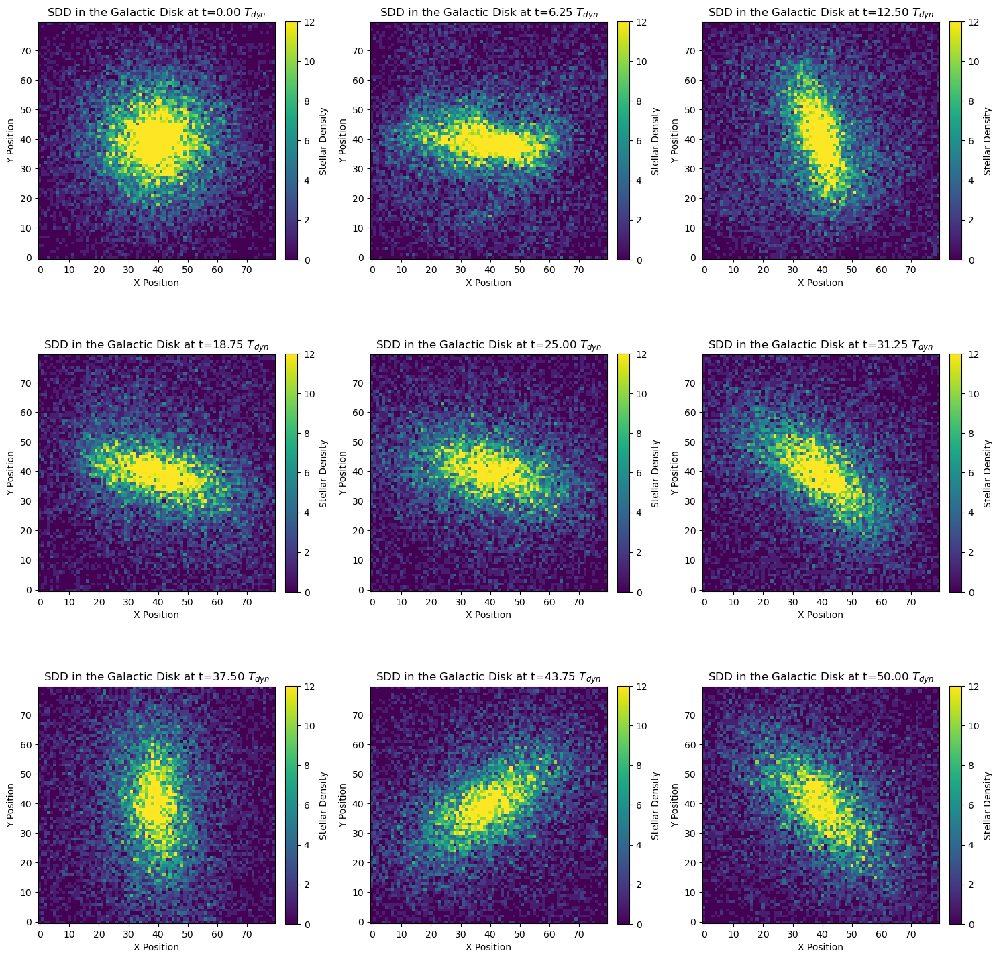

In [42]:
fig = plt.figure(figsize=(15, 15), tight_layout=True)

frames = 9
index=1
time_array=np.linspace(0, len(t_s)-1, frames, dtype=int)

t_dyn_units = t_s/T

for i in time_array:
    ax=fig.add_subplot(int(np.sqrt(frames)), int(np.sqrt(frames)),index)
    
    hist, x_edges, y_edges = np.histogram2d(x_s[:, i], y_s[:, i], bins=[x_bins, y_bins])
    density_distribution = hist.T 
    
    image=plt.imshow(density_distribution, origin='lower', cmap='viridis', clim = (0, 12))
    plt.colorbar(image, label='Stellar Density', fraction=0.046, pad=0.04)
    plt.xlabel('X Position')
    plt.ylabel('Y Position')
    plt.title(f'SDD in the Galactic Disk at t={t_s[i] / T:.2f} $T_{{dyn}}$')
    
    index +=1



plt.tight_layout()
plt.show()

## Pattern speed

In [43]:
max_r = R[2000:][omega_tot(R[2000:]) - k_tot(R[2000:])/2 == max(omega_tot(R[2000:]) - k_tot(R[2000:])/2)][0]
max_omega = max(omega_tot(R[2000:]) - k_tot(R[2000:])/2)
max_r

1.1524897812386425

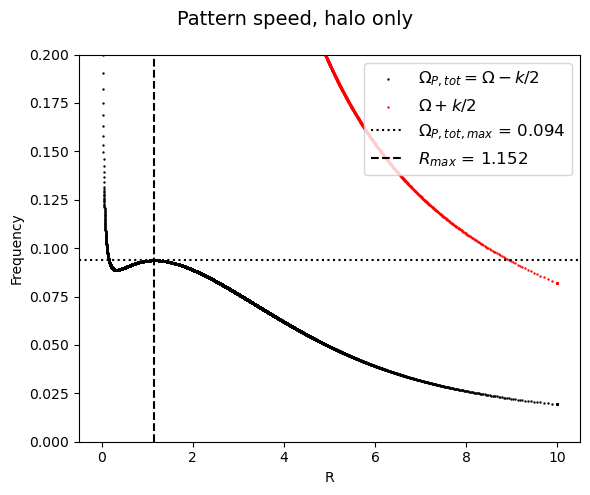

In [44]:
fig = plt.figure(figsize = (6,5))
fig.suptitle('Pattern speed, halo only', fontsize=14)

ax = fig.add_subplot(111)

#ax.scatter(R, omega_circ_disk(R) - 0.5*kappa_disk(R) , s=0.5, color='gray', linestyle='dashed', label='$\Omega_{P,disk}$') 
ax.scatter(R, omega_tot(R) - k_tot(R)/2, color='black', s=0.5, label='$\Omega_{P,tot} = \Omega - k/2$')
ax.scatter(R, omega_tot(R) + k_tot(R)/2, color='red', s=0.5, label='$\Omega + k/2$')
ax.axhline(max_omega, linestyle='dotted', color='black', label='$\Omega_{P,tot,max}$ = 'f'{round(max_omega,3)}')
ax.axvline(max_r, color='black',linestyle='dashed', label = '$R_{max}$ = 'f'{round(max_r,3)}')
ax.set_ylim(0,0.2)
ax.set_xlabel('R')
ax.set_ylabel('Frequency')
ax.legend(fontsize='large',loc='upper right')
#ax.set_title('Radial and azimuthal freq, halo only');
           
plt.tight_layout()
plt.show()

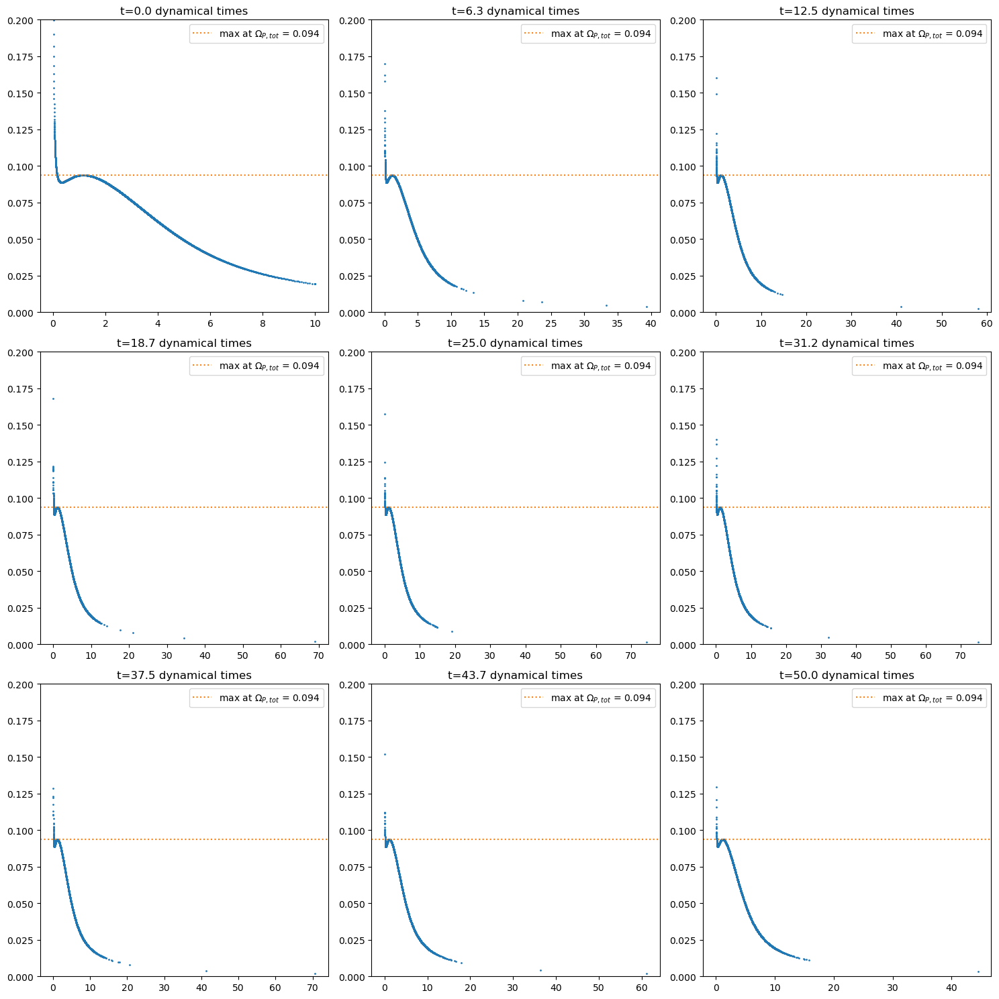

In [45]:
fig = plt.figure(figsize=(15, 15), tight_layout=True)

frames=9
index=1
time_array=np.linspace(0, len(t_s)-1, frames, dtype=int)

t_dyn_units = t_s/T

for i in time_array:
    
    ax=fig.add_subplot(int(np.sqrt(frames)), int(np.sqrt(frames)),index)
    
    omega_tot_t = omega_tot(R_t[:,i])
    kappa_tot_t = k_tot(R_t[:,i])
    
    #ax.scatter(R_t[:,i], omega_circ_disk(R_t[:,i]) - 0.5*kappa_disk(R_t[:,i]), s=1)# , color='black', linestyle='dashed', label='$\Omega_{P,disk}$') 
    ax.scatter(R_t[:,i], omega_tot_t - kappa_tot_t/2, s=1)#, color='black', label='$\Omega_{P,tot}$')
    #ax.axhline(0.06, linestyle='dotted', color='black')#, label='Plateau at $\Omega_{P,tot}$ = 'f'{0.06}')
    #ax.axhline(max(omega_tot(R) - k_tot(R)/2), linestyle='dotted', color='black', label='max at $\Omega_{P,tot}$ = 'f'{0.06}')
    ax.axhline(max(omega_tot_t[R_t[:,i] > 1] - kappa_tot_t[R_t[:,i] > 1]/2), linestyle='dotted', color='tab:orange', label='max at $\Omega_{P,tot}$ = 'f'{round(max(omega_tot_t[R_t[:,i] > 1] - kappa_tot_t[R_t[:,i] > 1]/2),3)}')
    #ax.text(3,0.01,'$R_{bar}$ = 'f'{round((R_t[:,i][ np.where((omega_tot_t - kappa_tot_t/2)==max(omega_tot_t - kappa_tot_t/2))][-1]),3)}')
    ax.set_title('t=%.1f dynamical times' %t_dyn_units[i])
    ax.legend()
    ax.set_ylim(0,0.2)
    #ax.set_xlim(0,5*R_d)
    
    index +=1

plt.show()

In [46]:
ring = np.arange(0.2,20.0, 0.2)
min_r = np.zeros(len(t_s))

for i in tqdm(range(len(t_s))):
    axial_ratios_r  = []

    for j in ring:
        axial_ratio, _, _, _ , _ = ellipse_params(x_s[:,i][R_t[:,i] < j], y_s[:,i][R_t[:,i] < j])
        axial_ratios_r.append(axial_ratio)
    min_r[i] = ring[ axial_ratios_r == min(axial_ratios_r)]

100%|███████████████████████████████████████| 1001/1001 [02:25<00:00,  6.89it/s]


### Bar strenght profile per radius

In [47]:
r_bar = np.median(min_r[t_s > 5])
r_bar
err_r1 = np.percentile(min_r[t_s > 5],34)
err_r2 = np.percentile(min_r[t_s > 5],(100-34))

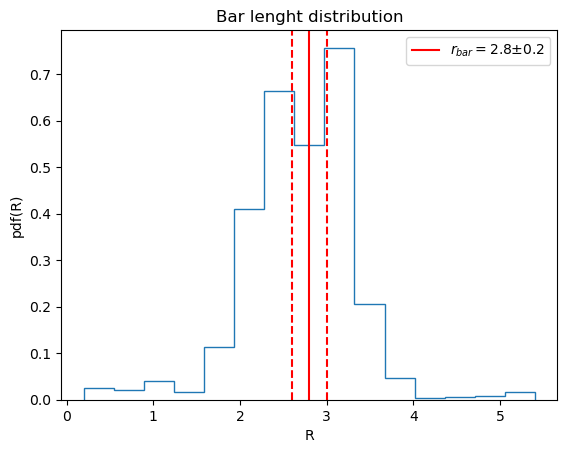

In [48]:
plt.hist(min_r[t_s > 5],bins=15,histtype='step', density=True)
plt.axvline(r_bar, color='r',label='$r_{bar} = $'f'{round(r_bar,3)}''$\pm$'f'{round(r_bar-err_r1,3)}')
plt.axvline(err_r1, color='r', linestyle = 'dashed')
plt.axvline(err_r2, color='r', linestyle = 'dashed')
plt.xlabel('R')
plt.ylabel('pdf(R)')
plt.title('Bar lenght distribution')
plt.legend()
plt.savefig("bar_lenght.pdf")
#plt.show()

In [49]:
print('bar median:',r_bar,' \nextent:',err_r1,'r bar',err_r2)

bar median: 2.8000000000000003  
extent: 2.6000000000000005 r bar 3.0000000000000004


In [50]:
err_r1-r_bar

-0.19999999999999973

In [51]:
print(t_dyn_units[100:].shape, min_r[t_dyn_units > t_dyn_units[99]].shape)

(901,) (901,)


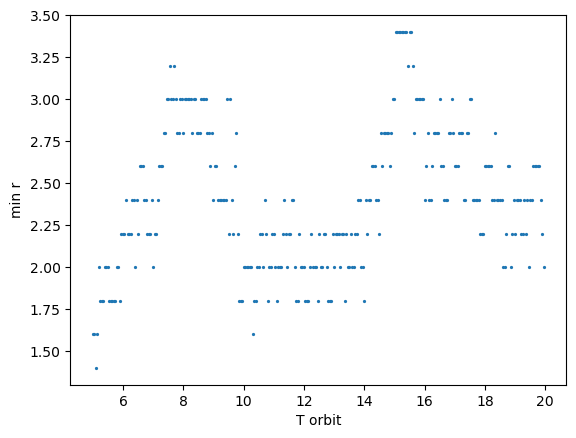

In [52]:
plt.scatter(t_dyn_units[100:400],min_r[(t_dyn_units > t_dyn_units[99]) & (t_dyn_units < t_dyn_units[400])],s=1.7)
plt.xlabel('T orbit')
plt.ylabel('min r');

In [53]:
min_ar = []

for j in tqdm(ring):
    axial_ratios_r  = []

    for i in range(len(t_s[:100])):
        axial_ratio, _, _, _ , _ = ellipse_params(x_s[:,i][R_t[:,i] < j], y_s[:,i][R_t[:,i] < j])
        axial_ratios_r.append(axial_ratio)
    min_ar.append(min(axial_ratios_r))
min_ar = np.array(min_ar)

100%|███████████████████████████████████████████| 99/99 [00:14<00:00,  6.78it/s]


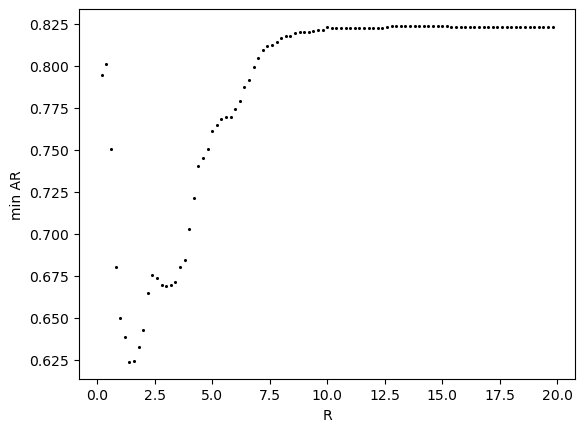

In [54]:
plt.scatter(ring,min_ar,c='black',s=1.5)
plt.xlabel('R')
plt.ylabel('min AR');

In [55]:
min(min_ar)

0.623666754699323

## Bar strenght

https://www.visiondummy.com/2014/04/draw-error-ellipse-representing-covariance-matrix/

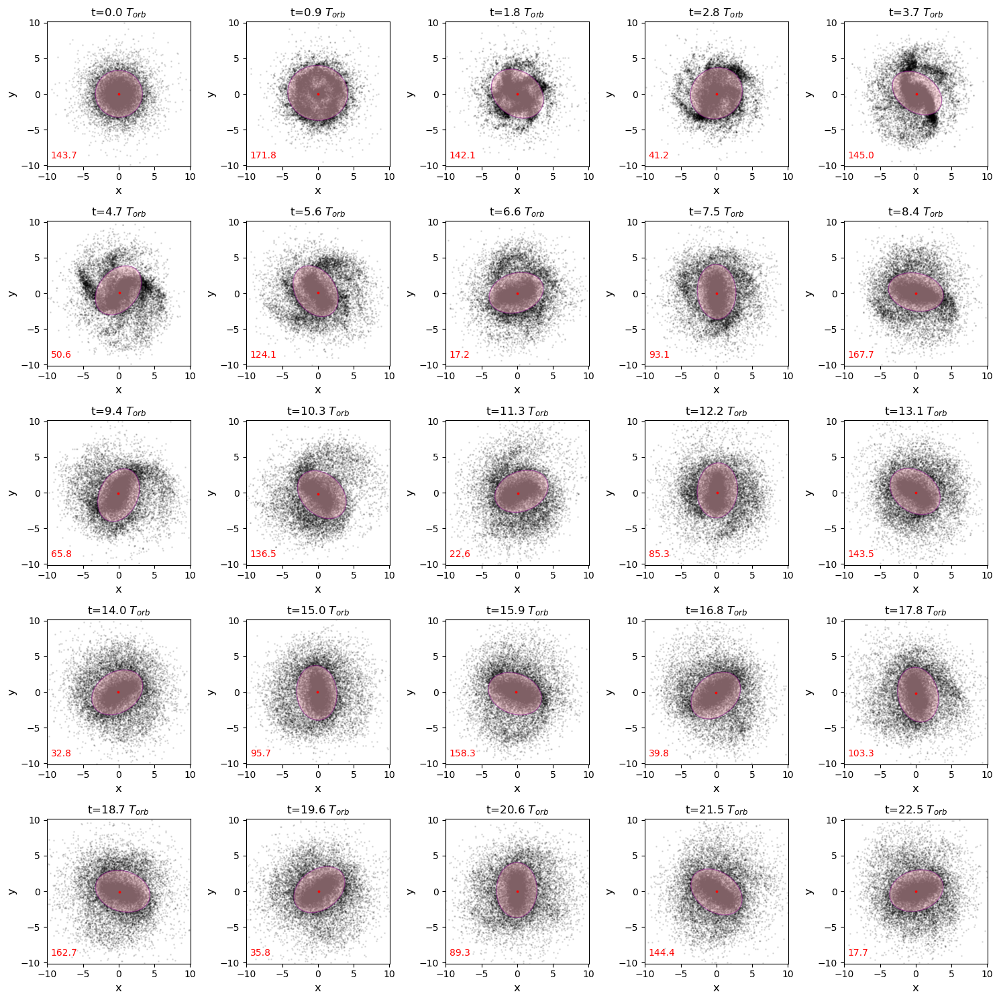

In [56]:
#import matplotlib.patches as patches
frames = 25

fig = plt.figure(figsize=(15, 15), tight_layout=True)

index = 1
time_array = np.linspace(0,450, frames, dtype=int)

t_dyn_units = t_s / T

for i in time_array:
    ax = fig.add_subplot(int(np.sqrt(frames)), int(np.sqrt(frames)), index)

    mu = x_cm_t[i], y_cm_t[i]

    ellipse, _, _, angle, _, _ = confidence_ellipse(x_s[:,i][R_t[:,i] < r_bar], y_s[:,i][R_t[:,i] < r_bar], mu[0], mu[1], ax, alpha=0.5, 
                                                facecolor='pink', edgecolor='purple', zorder=1)
    
    #ax.scatter(x_s[:,i][R_t[:,i] < r_bar], y_s[:,i][R_t[:,i] < r_bar], s=0.5, zorder=1,alpha=0.4)
    ax.scatter(x_s[:,i], y_s[:,i], s=1, c='black', alpha=0.1,zorder=-1)
    ax.scatter(mu[0], mu[1], c='red', s=3, zorder=2)
    #ax.plot([0, a_projx], [0, a_projy], lw=5, c='magenta', zorder=2)
    #ax.plot([0, b_projx], [0, b_projy], lw=5, c='orange', zorder=2)

    plt.title(r't=%.1f $T_{orb}$' % t_dyn_units[i])
    plt.axis('equal')
    plt.xlabel('x', fontsize=12)
    plt.ylabel('y', fontsize=12)
    plt.xlim(-10* R_d, 10* R_d)
    plt.ylim(-10* R_d, 10* R_d)
    plt.text(-9.5*R_d,-9*R_d,round(np.rad2deg(angle),1),color='r')
    index += 1

plt.show()


In [57]:
axial_ratios  = []
ellipticities = []
theta = []
major = []
minor = []

for i in range(len(t_s)):
    _, axial_ratio, ellipticity, angle, a , b = confidence_ellipse(x_s[:,i][R_t[:,i] < r_bar], y_s[:,i][R_t[:,i] < r_bar],x_cm_t[i], y_cm_t[i],
                                       ax, alpha=0.5, facecolor='pink', edgecolor='purple', zorder=0)
    major.append(a)
    minor.append(b)
    theta.append(angle)
    axial_ratios.append(axial_ratio)
    ellipticities.append(ellipticity)
    
axial_ratios  = np.array(axial_ratios ) 
ellipticities = np.array(ellipticities)
theta = np.array(theta)
major = np.array(major)
minor = np.array(minor)

In [58]:
step = int(len(t_s)/frames)
t_step = t_s[::step]/T

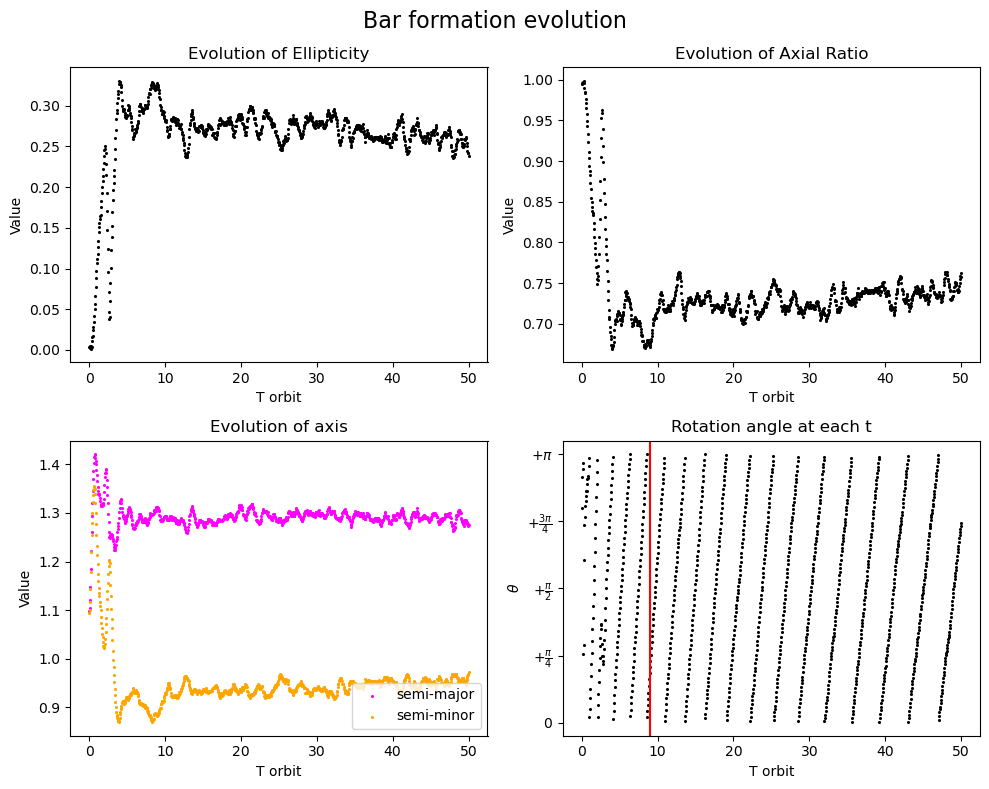

In [59]:
fig = plt.figure(figsize = (10,8))
fig.suptitle('Bar formation evolution', fontsize=16)

ax = fig.add_subplot(221)

ax.scatter(t_dyn_units, ellipticities, color='black', s=1.5)
ax.set_xlabel('T orbit')
#ax.set_xlabel('t=%.1f dynamical times' %t_dyn_units[i])
ax.set_ylabel('Value')
ax.set_title('Evolution of Ellipticity')


ax = fig.add_subplot(222)

ax.scatter(t_dyn_units, axial_ratios, color='black', s=1.5)
#ax.set_xlim(24,30)
ax.set_xlabel('T orbit')
ax.set_ylabel('Value')
ax.set_title('Evolution of Axial Ratio')

ax = fig.add_subplot(223)

ax.scatter(t_dyn_units, major, color='magenta', s=1.5, label='semi-major')
ax.scatter(t_dyn_units, minor, color='orange', s=1.5, label='semi-minor')
#ax.set_xlim(11,13.3)
ax.set_xlabel('T orbit')
ax.set_ylabel('Value')
ax.legend(loc='lower right')
ax.set_title('Evolution of axis')

ax = fig.add_subplot(224)

ax.scatter(t_dyn_units, theta, color='black', s=1.5)
ax.axvline(9, c='r')

y_pi   = np.array(theta)/np.pi
unit   = 0.25
y_tick = np.arange(0, 1+unit, unit)

y_label = [r"$0$", r"$+\frac{\pi}{4}$", r"$+\frac{\pi}{2}$", r"$+\frac{3 \pi}{4}$", r"$+\pi$"]
ax.set_yticks(y_tick*np.pi)
ax.set_yticklabels(y_label, fontsize=10)
ax.set_xlabel('T orbit')
ax.set_ylabel(r'$\theta$')
#ax.set_xlim(11,13.3)
#ax.legend()
ax.set_title('Rotation angle at each t')


plt.tight_layout()
plt.show()

In [60]:
theta_speed = []
t_speed = []

theta_speed.append(theta[0])
t_speed.append (t_s[0])

for i in range(len(theta)-1):
    if ((theta[i] - theta[i+1]) > 1):
        theta_speed.append(theta[i])
        theta_speed.append(theta[i+1])
        t_speed.append(t_s[i])
        t_speed.append(t_s[i+1])
        
theta_speed = np.array(theta_speed[12:])
t_speed     = np.array(t_speed[12:])

In [61]:
omega_bar = []
t_bar = []

for i in range(0,len(theta_speed)-1,2):
    omega_bar.append( (theta_speed[i+1] - theta_speed[i])/(t_speed[i+1] - t_speed[i]))
    t_bar.append((t_speed[i+1] + t_speed[i])/2)
omega_bar = np.array(omega_bar)
t_bar = np.array(t_bar)

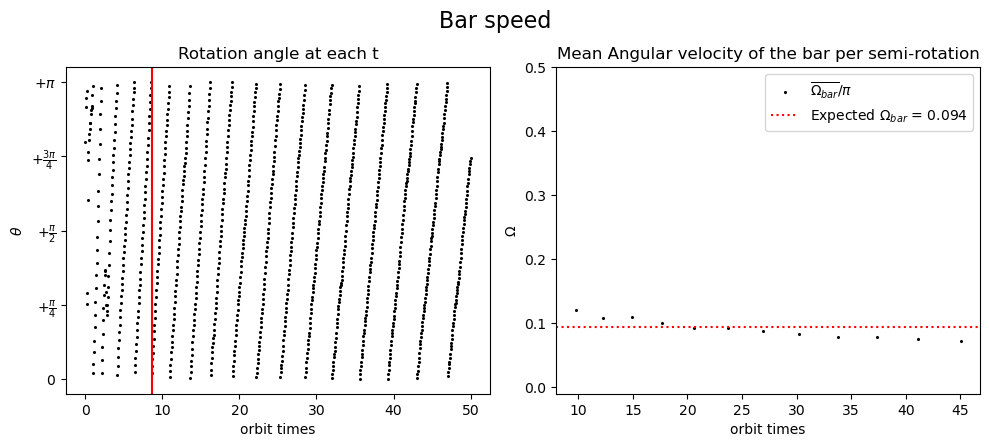

In [62]:
fig = plt.figure(figsize = (10,8))
fig.suptitle('Bar speed', fontsize=16)

ax = fig.add_subplot(221)

ax.scatter(t_dyn_units, theta, color='black', s=1.5)
ax.axvline(t_speed[0]/T, color='red')

y_pi   = np.array(theta)/np.pi
unit   = 0.25
y_tick = np.arange(0, 1+unit, unit)

y_label = [r"$0$", r"$+\frac{\pi}{4}$", r"$+\frac{\pi}{2}$", r"$+\frac{3 \pi}{4}$", r"$+\pi$"]
ax.set_yticks(y_tick*np.pi)
ax.set_yticklabels(y_label, fontsize=10)
ax.set_xlabel('orbit times')
ax.set_ylabel(r'$\theta$')
#ax.set_xlim(11,13.3)
#ax.legend()
ax.set_title('Rotation angle at each t')

ax = fig.add_subplot(222)
ax.scatter(t_bar/T, omega_bar, color='black', s=1.5, label='$\overline{\Omega_{bar}}/\pi$')
ax.axhline(max_omega, linestyle='dotted', color='r', 
           label='Expected $\Omega_{bar}$ = 'f'{round(max_omega,3)}')
ax.set_ylim(-0.01,0.5)
ax.set_xlabel('orbit times')
ax.set_ylabel(r'$\Omega$')
ax.set_title('Mean Angular velocity of the bar per semi-rotation')
ax.legend()

plt.tight_layout()
plt.show()

## Orbits (qualitative, not in report)

In [63]:
bar = np.zeros((len(x_s),len(t_s)))
arr2 = r_bar*np.ones(len(t_s))


for i in range(len(x_s)):
    if np.all((R_t[i,:] <= arr2)):
        #print(R_t[i,j])
        bar[i,:] = R_t[i,:]

In [64]:
x_bar = x_s[np.where(bar[:,0]  != 0)]
y_bar = y_s[np.where(bar[:,0]  != 0)]
z_bar = z_s[np.where(bar[:,0]  != 0)]
R_bar = np.sqrt(x_bar**2 + y_bar**2 + z_bar**2)
R_bar.shape

(3438, 1001)

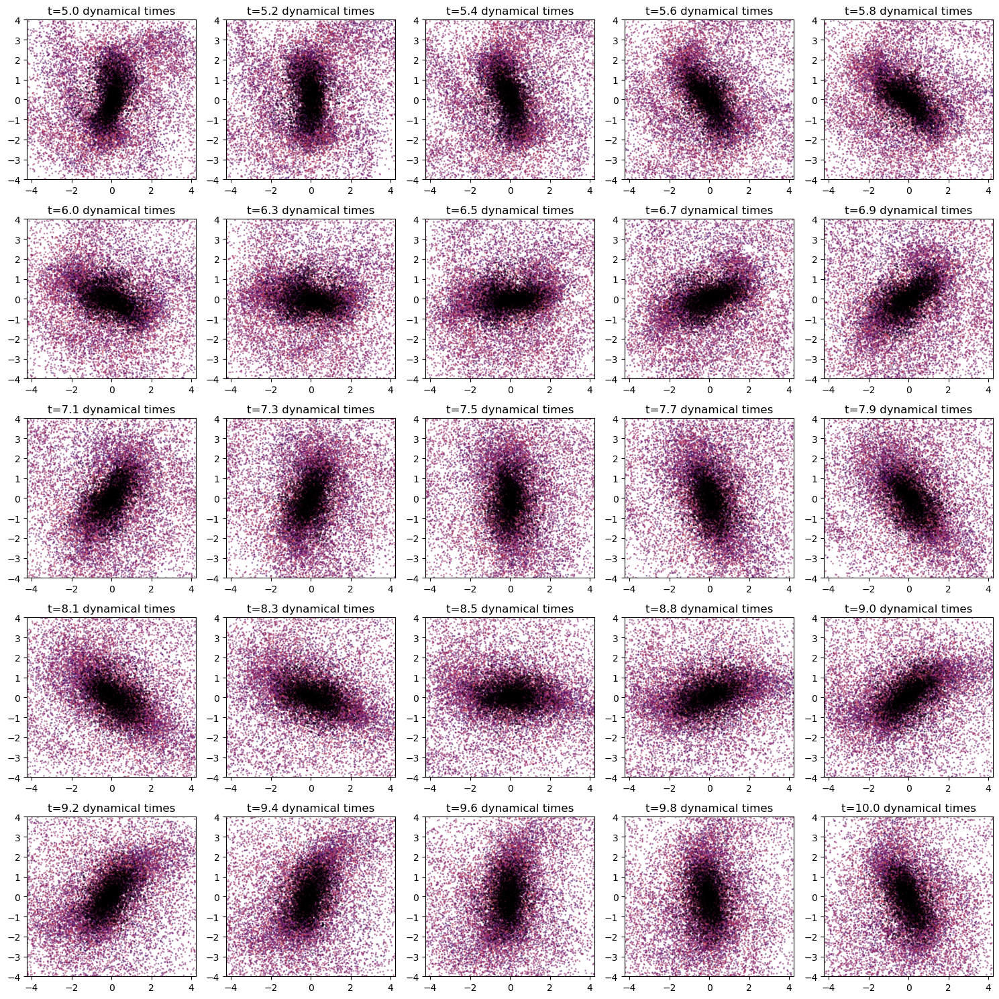

In [65]:
fig = plt.figure(figsize=(15, 15), tight_layout=True)
frames = 25
index=1
time_array=np.linspace(100, 200, frames, dtype=int)


for i in time_array:
    ax=fig.add_subplot(int(np.sqrt(frames)), int(np.sqrt(frames)),index)
    plt.scatter(x_s[:, i], y_s[:, i], c=v_t[:,i], s=1., alpha=0.4, cmap='inferno', clim=(0, max(v)))
    plt.title('t=%.1f dynamical times' %t_dyn_units[i])
#    plt.scatter(x1, x2, color='red',alpha=1, s=0.5, label='$R_d$')
    plt.scatter(x_cm_t[i], y_cm_t[i], s=2, c='red') #Center of mass
    plt.scatter(x_bar[:, i], y_bar[:, i], c='black',s=1.2,alpha=0.3)
    plt.axis('equal')
    
    plt.xlim(-4*R_d,4*R_d)
    plt.ylim(-4*R_d,4*R_d)
    
    index +=1

plt.show()

In [66]:
omega_tot_bar = np.zeros((R_bar.shape[0], R_bar.shape[1]))
kappa_tot_bar = np.zeros((R_bar.shape[0], R_bar.shape[1]))
for i in range(len(t_s)):
    omega_tot_bar[:,i] = omega_tot(R_bar[:,i])
    kappa_tot_bar[:,i] = k_tot(R_bar[:,i])

### closed orbits?

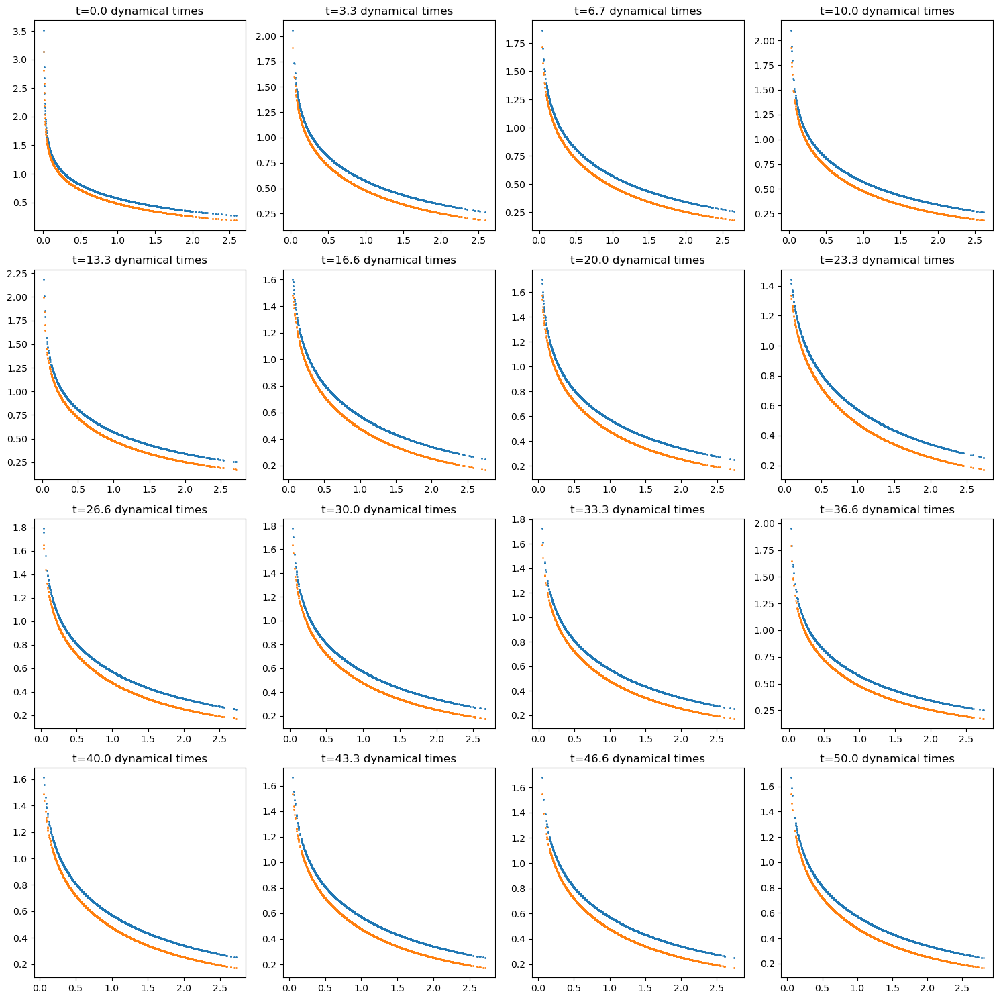

In [67]:
fig = plt.figure(figsize=(15, 15), tight_layout=True)

frames = 16
index=1
time_array=np.linspace(0, len(t_s)-1, frames, dtype=int)

t_dyn_units = t_s/T

for i in time_array:
    
    ax=fig.add_subplot(int(np.sqrt(frames)), int(np.sqrt(frames)),index)
    
    
    
    ax.scatter(R_bar[:,i], omega_tot_bar[:,i], s=1)# , color='black', linestyle='dashed', label='$\Omega_{P,disk}$') 
    ax.scatter(R_bar[:,i], kappa_tot_bar[:,i]/2, s=1)#, color='black', label='$\Omega_{P,tot}$')
    #ax.axhline(0.06, linestyle='dotted', color='black')#, label='Plateau at $\Omega_{P,tot}$ = 'f'{0.06}')
    #ax.axhline(max(omega_tot(R) - k_tot(R)/2), linestyle='dotted', color='black', label='max at $\Omega_{P,tot}$ = 'f'{0.06}')
    #ax.axhline(max(omega_tot_t - kappa_tot_t/2), linestyle='dotted', color='tab:orange', label='max# at $\Omega_{P,tot}$ = 'f'{0.06}')
    ax.set_title('t=%.1f dynamical times' %t_dyn_units[i])
    #ax.set_ylim(0,0.2)
    #ax.set_xlim(0,5*R_d)
    
    index +=1

plt.show()

### some orbits

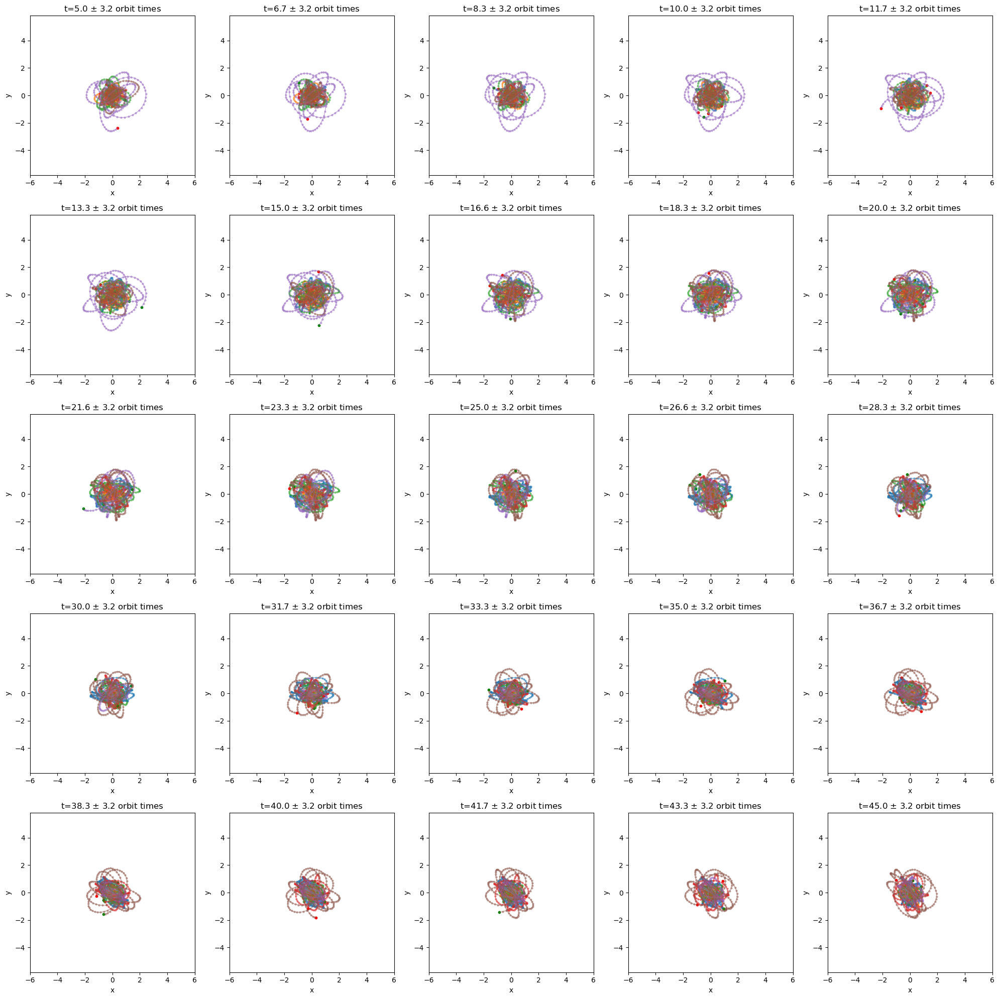

In [68]:
fig = plt.figure(figsize=(20, 20), tight_layout=True)

frames=25
index=1
time_array=np.linspace(100, len(t_s)-100, frames, dtype=int)


for i in time_array:
    
    ax=fig.add_subplot(int(np.sqrt(frames)), int(np.sqrt(frames)),index)
    plt.scatter(x_cm_t[i], y_cm_t[i], s=5, c='black') #Center of mass
    #plt.scatter(x_bar[:, i], y_bar[:, i], c='black',s=1.2,alpha=0.3,zorder=-1)
    
    for c in np.arange(len(x_bar[::500])-1):
        plt.scatter(x_bar[::500,(i-100):(i+100)][c], y_bar[::500,(i-100):(i+100)][c], s=5., alpha=0.4)
        plt.scatter(x_bar[::500,(i-100)][c], y_bar[::500,(i-100)][c], s=10., c='green', alpha=1)
        plt.scatter(x_bar[::500,(i+99)][c], y_bar[::500,(i+99)][c], s=10., c='red', alpha=1)
        plt.plot(x_bar[::500,(i-100):(i+100)][c], y_bar[::500,(i-100):(i+100)][c], alpha=0.4)
    plt.title('t=%.1f $\pm$ 3.2 orbit times' %t_dyn_units[i])
    plt.axis('equal')
    
    plt.xlabel('x')
    plt.ylabel('y')
    plt.xlim(-6*R_d,6*R_d)
    plt.ylim(-6*R_d,6*R_d)
    index +=1

plt.show()

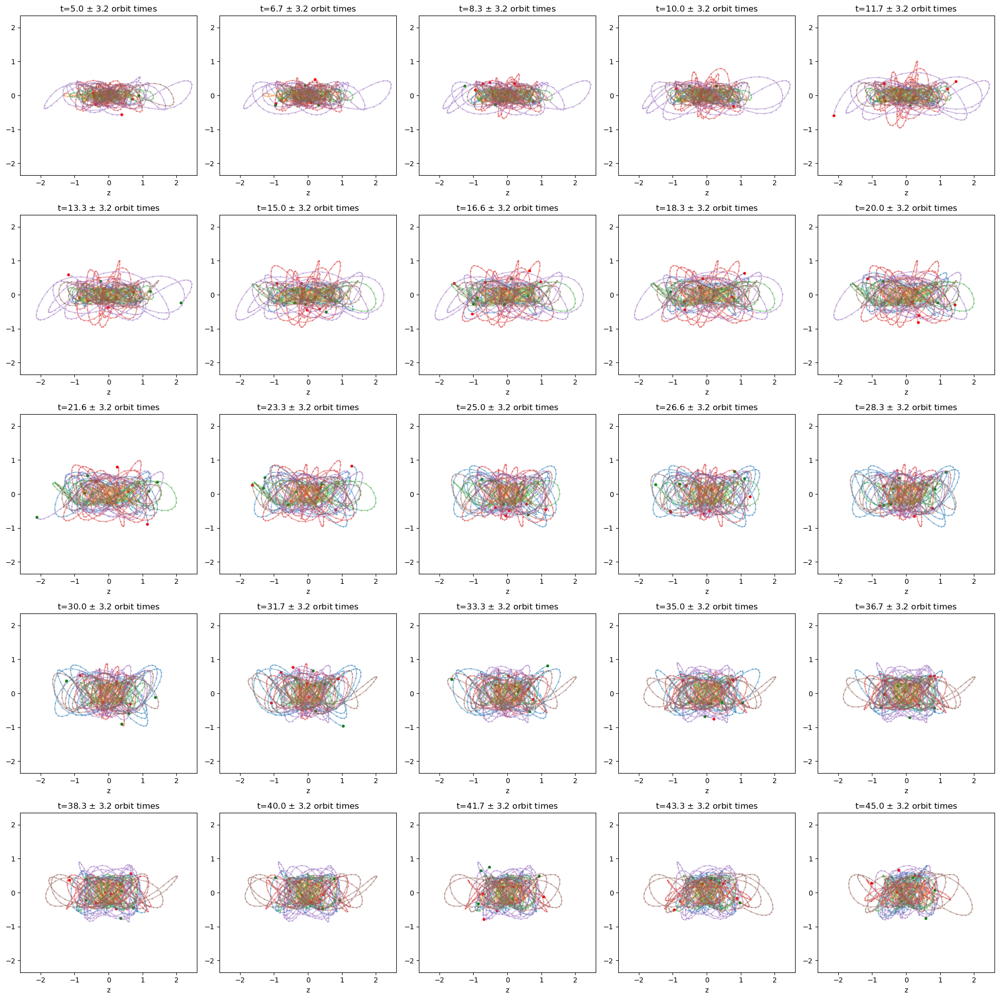

In [69]:
fig = plt.figure(figsize=(20, 20), tight_layout=True)

frames=25
index=1
time_array=np.linspace(100, len(t_s)-100, frames, dtype=int)

for i in time_array:
    ax=fig.add_subplot(int(np.sqrt(frames)), int(np.sqrt(frames)),index)
    for c in np.arange(len(x_bar[::500])-1):
        plt.scatter(x_bar[::500,(i-100):(i+100)][c], z_bar[::500,(i-100):(i+100)][c], s=1., alpha=0.4)
        plt.scatter(x_bar[::500,(i-100)][c], z_bar[::500,(i-100)][c], s=10., c='green', alpha=1)
        plt.scatter(x_bar[::500,(i+99)][c], z_bar[::500,(i+99)][c], s=10., c='red', alpha=1)
        plt.plot(x_bar[::500,(i-100):(i+100)][c], z_bar[::500,(i-100):(i+100)][c], alpha=0.4)
    plt.title('t=%.1f $\pm$ 3.2 orbit times' %t_dyn_units[i])
    plt.axis('equal')
    plt.xlabel('x')
    plt.xlabel('z')
    plt.xlim(-2.6*R_d,2.6*R_d)
    plt.ylim(-2.6*R_d,2.6*R_d)
    index +=1

plt.show()

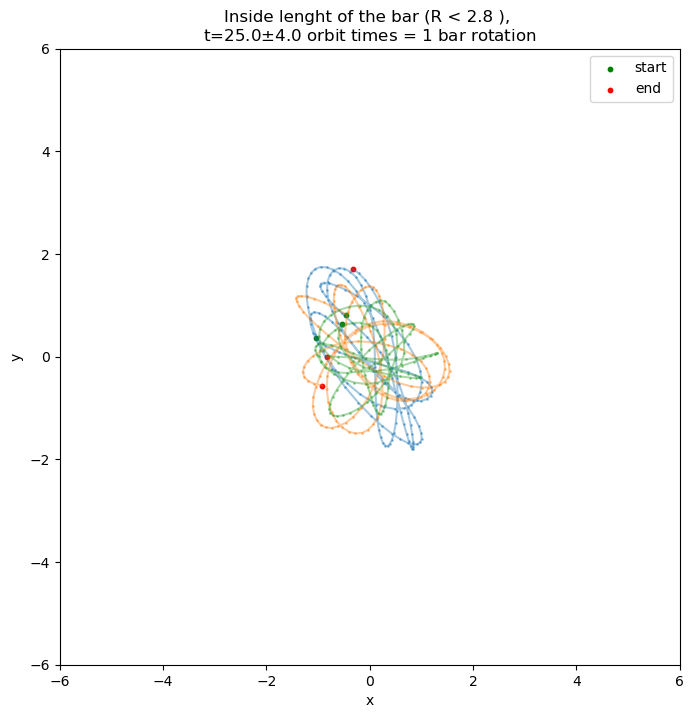

In [70]:
from tqdm import tqdm

fig = plt.figure(figsize = (8,8))

ax = fig.add_subplot(111)

t = time_array[12]
t_one_orbit = 80   #at orbit time between 20 and 28
num_part = 188
for c in np.arange(185,len(x_bar[:num_part])-1):
        plt.scatter(x_bar[:num_part,(t-t_one_orbit):(t+t_one_orbit)][c], y_bar[:num_part,(t-t_one_orbit):(t+t_one_orbit)][c], s=1., alpha=0.4)
        plt.plot(x_bar[:num_part,(t-t_one_orbit):(t+t_one_orbit)][c], y_bar[:num_part,(t-t_one_orbit):(t+t_one_orbit)][c], alpha=0.4)
        plt.scatter(x_bar[:num_part,(t-t_one_orbit)][c], y_bar[:num_part,(t-t_one_orbit)][c], s=10., c='green')
        plt.scatter(x_bar[:num_part,(t+t_one_orbit-1)][c], y_bar[:num_part,(t+t_one_orbit-1)][c], s=10., c='red')

plt.scatter(x_bar[num_part,(t-t_one_orbit):(t+t_one_orbit)], y_bar[num_part,(t-t_one_orbit):(t+t_one_orbit)], s=1., alpha=0.4)
plt.plot(x_bar[num_part,(t-t_one_orbit):(t+t_one_orbit)], y_bar[num_part,(t-t_one_orbit):(t+t_one_orbit)], alpha=0.4)
plt.scatter(x_bar[num_part,(t-t_one_orbit)], y_bar[num_part,(t-t_one_orbit)], s=10., c='green', alpha=1,label='start')
plt.scatter(x_bar[num_part,(t+t_one_orbit-1)], y_bar[num_part,(t+t_one_orbit-1)], s=10., c='red', alpha=1,label='end')
plt.title('Inside lenght of the bar (R < 'f'{round(r_bar,2)}'' ), \nt='f'{round(t_dyn_units[t],1)}''$\pm$'f'{round(t_dyn_units[t_one_orbit],1)}'' orbit times = 1 bar rotation')
plt.xlabel('x')
plt.ylabel('y')
plt.xlim(-6*R_d,6*R_d)
plt.ylim(-6*R_d,6*R_d)
plt.legend()
plt.show()

In [71]:
nonbar = np.zeros((len(x_s),len(t_s)))
arr2 = r_bar*np.ones(len(t_s))


for i in range(len(x_s)):
    if np.all((R_t[i,:] >= arr2)):
        #print(R_t[i,j])
        nonbar[i,:] = R_t[i,:]

In [72]:
x_nonbar = x_s[np.where(nonbar[:,0]  != 0)]
y_nonbar = y_s[np.where(nonbar[:,0]  != 0)]
z_nonbar = z_s[np.where(nonbar[:,0]  != 0)]
R_nonbar = np.sqrt(x_nonbar**2 + y_nonbar**2 + z_nonbar**2)
R_nonbar.shape

(1153, 1001)

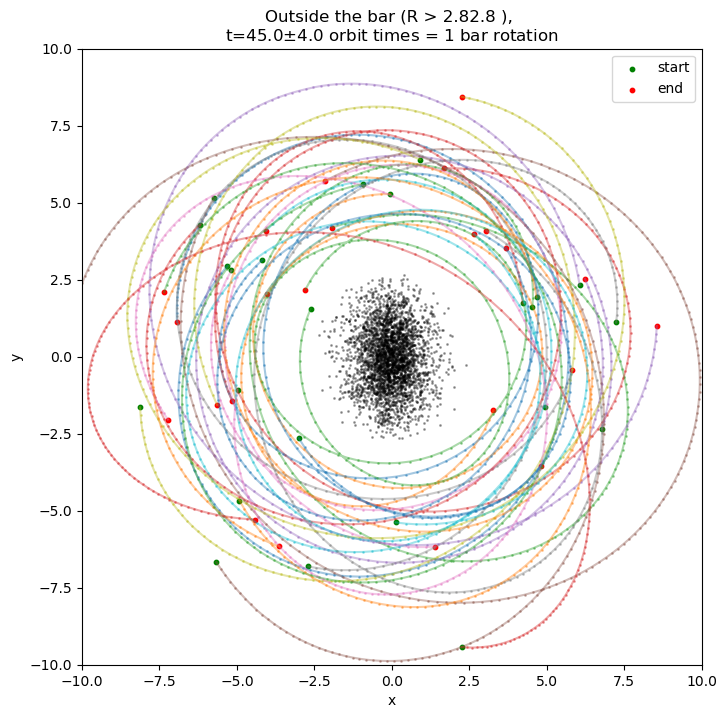

In [73]:
from tqdm import tqdm

fig = plt.figure(figsize = (8,8))

ax = fig.add_subplot(111)

t = time_array[24]
t_one_orbit = 80   #at orbit time between 20 and 28
num_part = 24      #tra 21 e 24 orbita carina
for c in np.arange(0,len(x_nonbar[:num_part])-1):
        plt.scatter(x_nonbar[:num_part,(t-t_one_orbit):(t+t_one_orbit)][c], y_nonbar[:num_part,(t-t_one_orbit):(t+t_one_orbit)][c], s=1., alpha=0.4)
        plt.plot(x_nonbar[:num_part,(t-t_one_orbit):(t+t_one_orbit)][c], y_nonbar[:num_part,(t-t_one_orbit):(t+t_one_orbit)][c], alpha=0.4)
        plt.scatter(x_nonbar[:num_part,(t-t_one_orbit)][c], y_nonbar[:num_part,(t-t_one_orbit)][c], s=10., c='green', alpha=1)
        plt.scatter(x_nonbar[:num_part,(t+t_one_orbit-1)][c], y_nonbar[:num_part,(t+t_one_orbit-1)][c], s=10., c='red', alpha=1)

plt.scatter(x_nonbar[num_part,(t-t_one_orbit):(t+t_one_orbit)], y_nonbar[num_part,(t-t_one_orbit):(t+t_one_orbit)], s=1., alpha=0.4)
plt.plot(x_nonbar[num_part,(t-t_one_orbit):(t+t_one_orbit)], y_nonbar[num_part,(t-t_one_orbit):(t+t_one_orbit)], alpha=0.4)
plt.scatter(x_nonbar[num_part,(t-t_one_orbit)], y_nonbar[num_part,(t-t_one_orbit)], s=10., c='green', alpha=1, label='start')
plt.scatter(x_nonbar[num_part,(t+t_one_orbit-1)], y_nonbar[num_part,(t+t_one_orbit-1)], s=10., c='red', alpha=1,label='end')

plt.scatter(x_bar[:, t+t_one_orbit], y_bar[:, t+t_one_orbit], c='black',s=1.2,alpha=0.3)

plt.title('Outside the bar (R > 'f'{round(r_bar,2)}{round(r_bar,2)}'' ), \nt='f'{round(t_dyn_units[t],1)}''$\pm$'f'{round(t_dyn_units[t_one_orbit],1)}'' orbit times = 1 bar rotation')
plt.xlabel('x')
plt.ylabel('y')
plt.xlim(-10*R_d,10*R_d)
plt.ylim(-10*R_d,10*R_d)
plt.legend()
plt.show()

In [74]:
inbar = np.zeros((len(x_s),len(t_s)))
arr2 = 1.5*np.ones(len(t_s))


for i in range(len(x_s)):
    if np.all((R_t[i,:] <= arr2)):
        #print(R_t[i,j])
        inbar[i,:] = R_t[i,:]

x_inbar = x_s[np.where(inbar[:,0]  != 0)]
y_inbar = y_s[np.where(inbar[:,0]  != 0)]
z_inbar = z_s[np.where(inbar[:,0]  != 0)]
R_inbar = np.sqrt(x_inbar**2 + y_inbar**2 + z_inbar**2)
R_inbar.shape

(420, 1001)

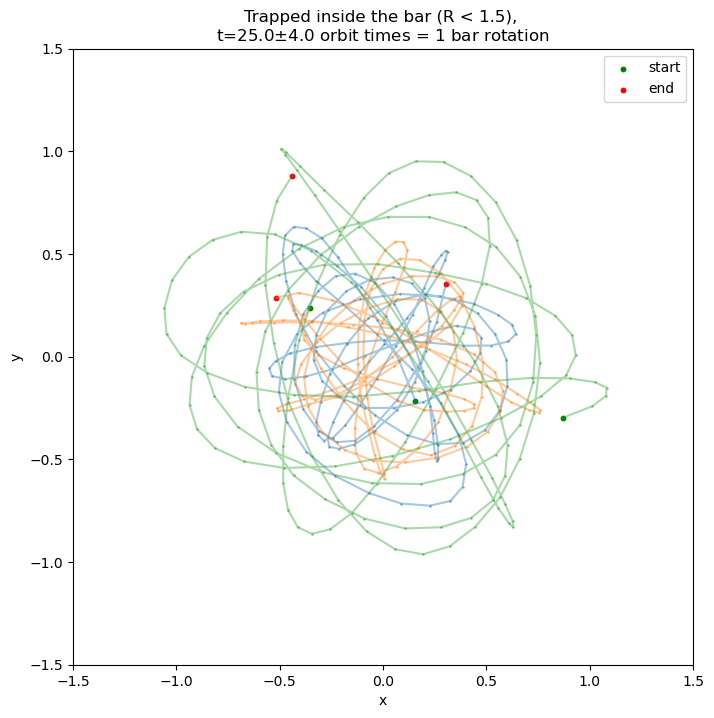

In [75]:
from tqdm import tqdm

fig = plt.figure(figsize = (8,8))

ax = fig.add_subplot(111)
ax.set_xlabel('x')
ax.set_ylabel('y')

t = time_array[12]
t_one_orbit = 80   #at orbit time between 20 and 28
num_part = 3
for c in np.arange(len(x_inbar[:num_part])-1):
        plt.scatter(x_inbar[:num_part,(t-t_one_orbit):(t+t_one_orbit)][c], y_inbar[:num_part,(t-t_one_orbit):(t+t_one_orbit)][c], s=1., alpha=0.4)
        plt.plot(x_inbar[:num_part,(t-t_one_orbit):(t+t_one_orbit)][c], y_inbar[:num_part,(t-t_one_orbit):(t+t_one_orbit)][c], alpha=0.4)
        plt.scatter(x_inbar[:num_part,(t-t_one_orbit)][c], y_inbar[:num_part,(t-t_one_orbit)][c], s=10., c='green', alpha=1)
        plt.scatter(x_inbar[:num_part,(t+t_one_orbit-1)][c], y_inbar[:num_part,(t+t_one_orbit-1)][c], s=10., c='red', alpha=1)

plt.scatter(x_inbar[num_part,(t-t_one_orbit):(t+t_one_orbit)], y_inbar[num_part,(t-t_one_orbit):(t+t_one_orbit)], s=1., alpha=0.4)
plt.plot(x_inbar[num_part,(t-t_one_orbit):(t+t_one_orbit)], y_inbar[num_part,(t-t_one_orbit):(t+t_one_orbit)], alpha=0.4)
plt.scatter(x_inbar[num_part,(t-t_one_orbit)], y_inbar[num_part,(t-t_one_orbit)], s=10., c='green', alpha=1, label='start')
plt.scatter(x_inbar[num_part,(t+t_one_orbit-1)], y_inbar[num_part,(t+t_one_orbit-1)], s=10., c='red', alpha=1,label='end')
plt.title('Trapped inside the bar (R < 1.5), \nt='f'{round(t_dyn_units[t],1)}''$\pm$'f'{round(t_dyn_units[t_one_orbit],1)}'' orbit times = 1 bar rotation ')
plt.xlabel('x')
plt.ylabel('y')
plt.xlim(-1.5*R_d,1.5*R_d)
plt.ylim(-1.5*R_d,1.5*R_d)
plt.legend()
plt.show()

# Animation

In [ ]:
positions = np.array([x_s.T, y_s.T, z_s.T]).T

## 2d

In [ ]:
def create_particle_animation_2d(positions, interval=50, save_path=None):
    """
    Create a 2D animation of particle positions by ignoring the z-component.

    Parameters:
    - positions: A NumPy array of shape (num_particles, num_frames, 3) representing
                 the 3D positions of particles over time.
    - interval: Time delay between frames in milliseconds.
    - save_path: The path to save the animation as a video file (e.g., 'animation.mp4').

    Returns:
    - ani: The animation object.
    """
    num_particles, num_frames, _ = positions.shape

    fig, ax = plt.subplots()
    ax.set_xlim(-10, 10)
    ax.set_ylim(-10, 10)
    scatter = ax.scatter(positions[:, 0, 0], positions[:, 0, 1], c='black', s=1, alpha=0.3)

    def update(frame):
        scatter.set_offsets(positions[:, frame, :2])  # Ignore the z-component
        ax.set_title('t=%.1f dynamical times' %t_dyn_units[frame], fontsize=13)
        return scatter,

    ani = FuncAnimation(fig, update, frames=num_frames, interval=interval, blit=False)

    if save_path:
        ani.save(save_path, writer='ffmpeg', fps=interval)  # Adjust fps as needed

    plt.show()

    return ani

# Example usage:
# Assuming 'particle_positions' is a NumPy array of shape (num_particles, num_frames, 3)
# You should replace this with your actual data.

create_particle_animation_2d(positions, save_path='esp_disk_2d.gif')

## Fancy gif

In [ ]:
def create_particle_animation_xy_projection(positions, v_t, t_dyn_units, interval=50, save_path=None):
    """
    Create a 2D animation of particle positions using x and y coordinates WITH COLORBAR.

    Parameters:
    - positions: A NumPy array of shape (num_particles, num_frames, 3) representing
                 the 3D positions of particles over time.
    - v_t: A NumPy array of shape (num_particles, num_frames) representing the velocity
           of particles over time.
    - t_dyn_units: A NumPy array of shape (num_frames,) representing time units.
    - interval: Time delay between frames in milliseconds.
    - save_path: The path to save the animation as a video file (e.g., 'animation.mp4').

    Returns:
    - ani: The animation object.
    """
    num_particles, num_frames, _ = positions.shape

    fig, ax = plt.subplots()
    ax.axis('equal')
    ax.set_xlim(-10*R_d, 10*R_d)
    ax.set_ylim(-10*R_d, 10*R_d)
    scatter = ax.scatter(positions[:, 0, 0], positions[:, 0, 1], s=2, c=v_t[:, 0], cmap='inferno', clim=(0, 1.5))
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_facecolor('xkcd:black')
    ax.grid(False)

    # Add colorbar
    cbar = fig.colorbar(scatter, ax=ax, orientation='vertical', label='Velocity')

    ani = None  # Initialize ani

    def update(frame, ani):
        scatter.set_offsets(positions[:, frame, :2])
        scatter.set_array(v_t[:, frame])
        ax.set_title('t=%.1f orbital period' % t_dyn_units[frame], fontsize=13)
        return scatter,

    ani = FuncAnimation(fig, update, frames=num_frames, interval=interval, blit=False, fargs=(ani,))

    if save_path:
        with tqdm(total=num_frames, desc='Creating Animation') as pbar:
            def update_with_progress(frame, ani):
                pbar.update(1)
                return update(frame, ani)

            ani.save(save_path, writer='ffmpeg', fps=interval, dpi=300, progress_callback=update_with_progress)
    else:
        plt.show()

    return ani

# Example usage:
# Assuming 'particle_positions' is a NumPy array of shape (num_particles, num_frames, 3)
# You should replace this with your actual data.

create_particle_animation_xy_projection(positions, v_t, t_dyn_units, save_path='esp_disk_xy_zoom1_projection.gif')

In [ ]:
def create_particle_animation_xz_projection(positions, v_t, t_dyn_units, interval=50, save_path=None):
    """
    Create a 2D animation of particle positions using x and z coordinates WITH COLORBAR.

    Parameters:
    - positions: A NumPy array of shape (num_particles, num_frames, 3) representing
                 the 3D positions of particles over time.
    - v_t: A NumPy array of shape (num_particles, num_frames) representing the velocity
           of particles over time.
    - t_dyn_units: A NumPy array of shape (num_frames,) representing time units.
    - interval: Time delay between frames in milliseconds.
    - save_path: The path to save the animation as a video file (e.g., 'animation.mp4').

    Returns:
    - ani: The animation object.
    """
    num_particles, num_frames, _ = positions.shape

    fig, ax = plt.subplots()
    ax.axis('equal')
    ax.set_xlim(-10*R_d, 10*R_d)
    ax.set_ylim(-10*R_d, 10*R_d)
    scatter = ax.scatter(positions[:, 0, 0], positions[:, 0, 2], s=2, c=v_t[:, 0], cmap='inferno', clim=(0, 1.5))
    ax.set_xlabel('x')
    ax.set_ylabel('z')
    ax.set_facecolor('xkcd:black')
    ax.grid(False)

    # Add colorbar
    cbar = fig.colorbar(scatter, ax=ax, orientation='vertical', label='Velocity')

    ani = None  # Initialize ani

    def update(frame, ani):
        scatter.set_offsets(positions[:, frame, 0::2])
        scatter.set_array(v_t[:, frame])
        ax.set_title('t=%.1f orbital period' % t_dyn_units[frame], fontsize=13)
        return scatter,

    ani = FuncAnimation(fig, update, frames=num_frames, interval=interval, blit=False, fargs=(ani,))

    if save_path:
        with tqdm(total=num_frames, desc='Creating Animation') as pbar:
            def update_with_progress(frame, ani):
                pbar.update(1)
                return update(frame, ani)

            ani.save(save_path, writer='ffmpeg', fps=interval, dpi=300, progress_callback=update_with_progress)
    else:
        plt.show()

    return ani

# Example usage:
# Assuming 'particle_positions' is a NumPy array of shape (num_particles, num_frames, 3)
# You should replace this with your actual data.

create_particle_animation_xz_projection(positions, v_t, t_dyn_units, save_path='esp_disk_xz_zoom1_projection.gif')

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

def create_particle_animation_2d_projection(positions, interval=50, save_path=None):
    """
    Create a 2D animation of particle positions using x and y coordinates.

    Parameters:
    - positions: A NumPy array of shape (num_particles, num_frames, 3) representing
                 the 3D positions of particles over time.
    - interval: Time delay between frames in milliseconds.
    - save_path: The path to save the animation as a video file (e.g., 'animation.mp4').

    Returns:
    - ani: The animation object.
    """
    num_particles, num_frames, _ = positions.shape

    fig, ax = plt.subplots()
    ax.axis('equal')
    ax.set_xlim(-20, 20)
    ax.set_ylim(-20, 20)
    scatter = ax.scatter(positions[:, 0, 0], positions[:, 0, 1], s=2, c=v_t[:,0], cmap='inferno', clim=(0, 1.5))
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_facecolor('xkcd:black')
    ax.grid(False)

    def update(frame):
        scatter.set_offsets(positions[:, frame, :2])
        scatter.set_array(v_t[:,frame])
        ax.set_title('t=%.1f orbital period' %t_dyn_units[frame], fontsize=13)
        return scatter,

    ani = FuncAnimation(fig, update, frames=num_frames, interval=interval, blit=False)

    if save_path:
        ani.save(save_path, writer='ffmpeg', fps=interval)  # Adjust fps and dpi as needed

    plt.show()

    return ani

# Example usage:
# Assuming 'particle_positions' is a NumPy array of shape (num_particles, num_frames, 3)
# You should replace this with your actual data.

create_particle_animation_2d_projection(positions, save_path='esp_disk_2d_projection_xy.gif')

In [ ]:
def create_3d_animation(positions, v_t, t_dyn_units, interval=50, save_path=None):
    """
    Create a 3D animation of particle positions with colorbar.

    Parameters:
    - positions: A NumPy array of shape (num_particles, num_frames, 3) representing
                 the 3D positions of particles over time.
    - v_t: A NumPy array of shape (num_particles, num_frames) representing the velocity
           of particles over time.
    - t_dyn_units: A NumPy array of shape (num_frames,) representing time units.
    - interval: Time delay between frames in milliseconds.
    - save_path: The path to save the animation as a video file (e.g., 'animation.mp4').

    Returns:
    - ani: The animation object.
    """
    num_particles, num_frames, _ = positions.shape

    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    ax.axis('equal')

    scatter = ax.scatter(positions[:, 0, 0], positions[:, 0, 1], positions[:, 0, 2], s=2, c=v_t[:, 0], cmap='inferno', clim=(0, 1.5))
    ax.set_facecolor('xkcd:black')
    ax.grid(False)

    # Add colorbar
    cbar = fig.colorbar(scatter, ax=ax, orientation='vertical', label='Velocity')

    ani = None  # Initialize ani

    def update(frame, ani):
        #scatter.set_offsets(positions[:, frame, :2])
        scatter._offsets3d = (positions[:, frame, 0], positions[:, frame, 1], positions[:, frame, 2])
        scatter.set_array(v_t[:, frame])
        ax.set_title('t=%.1f orbital period' % t_dyn_units[frame], fontsize=13)
        return scatter,

    ani = FuncAnimation(fig, update, frames=num_frames, interval=interval, blit=False, fargs=(ani,))

    if save_path:
        with tqdm(total=num_frames, desc='Creating Animation') as pbar:
            def update_with_progress(frame, ani):
                pbar.update(1)
                return update(frame, ani)

            ani.save(save_path, writer='ffmpeg', fps=interval, dpi=300, progress_callback=update_with_progress)
    else:
        plt.show()

    return ani

create_3d_animation(positions, v_t, t_dyn_units, save_path='esp_disk_3d_animation.gif')

In [ ]:
globals().clear()